Crop Sensitivity: Shapiro-Wilk test statistic = 0.9822, p-value = 0.1919
Crop Performance Change: Shapiro-Wilk test statistic = 0.9068, p-value = 0.0000
Flip Sensitivity: Shapiro-Wilk test statistic = 0.9727, p-value = 0.0343
Flip Performance Change: Shapiro-Wilk test statistic = 0.9067, p-value = 0.0000
Horizontal_flip Sensitivity: Shapiro-Wilk test statistic = 0.9373, p-value = 0.0001
Horizontal_flip Performance Change: Shapiro-Wilk test statistic = 0.9513, p-value = 0.0009
Vertical_flip Sensitivity: Shapiro-Wilk test statistic = 0.9451, p-value = 0.0004
Vertical_flip Performance Change: Shapiro-Wilk test statistic = 0.9421, p-value = 0.0002
Color_jitter Sensitivity: Shapiro-Wilk test statistic = 0.9364, p-value = 0.0001
Color_jitter Performance Change: Shapiro-Wilk test statistic = 0.9248, p-value = 0.0000
Grayscale Sensitivity: Shapiro-Wilk test statistic = 0.9304, p-value = 0.0000
Grayscale Performance Change: Shapiro-Wilk test statistic = 0.8925, p-value = 0.0000
Translation Sens

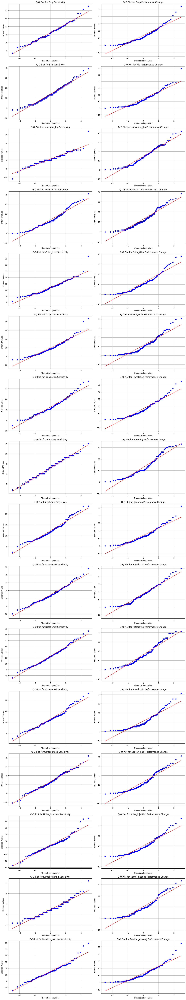

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import shapiro, probplot

# CSV 파일 경로
merged_results_path = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results.csv'

# CSV 파일 읽기
df = pd.read_csv(merged_results_path)

# Augmentation 방법 목록
augmentations = ['crop', 'flip','horizontal_flip','vertical_flip', 'color_jitter', 'grayscale', 'translation', 'shearing', 'rotation','rotation30','rotation60','rotation90', 'center_mask', 'noise_injection', 'kernel_filtering', 'random_erasing']

# 각 클래스에 대해 sensitivity와 performance_enhance 계산
for aug in augmentations:
    df[f'{aug}_sensitivity'] = df['original'] - df[aug]
    df[f'{aug}_performance_change'] = abs(df[f'aug_{aug}'] - df['original'])

# 정규성 검정 및 Q-Q Plot 생성
fig, axs = plt.subplots(len(augmentations), 2, figsize=(15, 5 * len(augmentations)))

for i, aug in enumerate(augmentations):
    sensitivity = df[f'{aug}_sensitivity']
    performance_change = df[f'{aug}_performance_change']
    
    # Shapiro-Wilk 테스트
    sensitivity_stat, sensitivity_p = shapiro(sensitivity)
    performance_change_stat, performance_change_p = shapiro(performance_change)
    
    print(f"{aug.capitalize()} Sensitivity: Shapiro-Wilk test statistic = {sensitivity_stat:.4f}, p-value = {sensitivity_p:.4f}")
    print(f"{aug.capitalize()} Performance Change: Shapiro-Wilk test statistic = {performance_change_stat:.4f}, p-value = {performance_change_p:.4f}")
    
    # Q-Q Plot
    probplot(sensitivity, dist="norm", plot=axs[i, 0])
    axs[i, 0].set_title(f'Q-Q Plot for {aug.capitalize()} Sensitivity')
    axs[i, 0].grid(True)
    
    probplot(performance_change, dist="norm", plot=axs[i, 1])
    axs[i, 1].set_title(f'Q-Q Plot for {aug.capitalize()} Performance Change')
    axs[i, 1].grid(True)

plt.tight_layout()
plt.show()

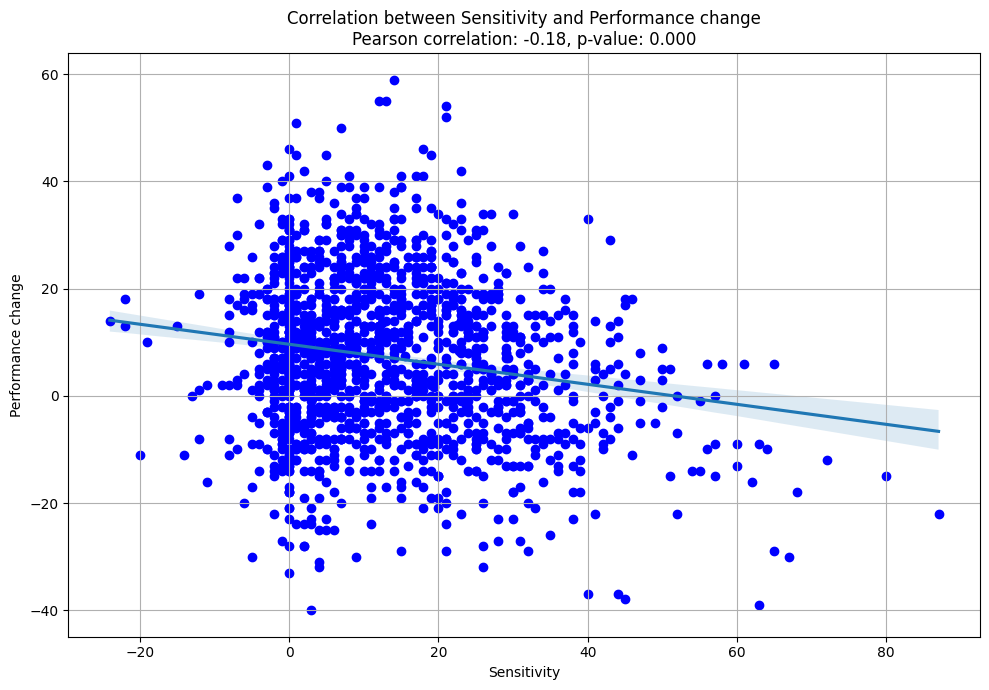

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import numpy as np

def pearson_to_all(merged_results_path, sensitivity_min=-np.inf, sensitivity_max=np.inf, performance_enhancement_min=-np.inf, performance_enhancement_max=np.inf):
    # CSV 파일 읽기
    df = pd.read_csv(merged_results_path)

    # Augmentation 방법 목록
    augmentations = ['crop', 'flip','horizontal_flip','vertical_flip', 'color_jitter', 'grayscale', 'translation', 'shearing', 'rotation','rotation30','rotation60','rotation90', 'center_mask', 'noise_injection', 'kernel_filtering', 'random_erasing']

    # sensitivity와 performance enhancement 계산 및 추가
    for aug in augmentations:
        df[f'{aug}_sensitivity'] = df['original'] - df[aug]
        df[f'{aug}_performance_enhancement'] = df[f'aug_{aug}'] - df['original']

    # 모든 방법론의 sensitivity와 performance enhancement를 하나의 데이터프레임으로 결합
    sensitivity_list = []
    performance_enhancement_list = []

    for aug in augmentations:
        sensitivity_list.extend(df[f'{aug}_sensitivity'])
        performance_enhancement_list.extend(df[f'{aug}_performance_enhancement'])

    combined_df = pd.DataFrame({
        'sensitivity': sensitivity_list,
        'performance_enhancement': performance_enhancement_list
    })

    # 사용자 지정 조건에 맞는 데이터 필터링
    filtered_df = combined_df[(combined_df['sensitivity'] >= sensitivity_min) & (combined_df['sensitivity'] <= sensitivity_max) &
                              (combined_df['performance_enhancement'] >= performance_enhancement_min) & (combined_df['performance_enhancement'] <= performance_enhancement_max)]

    # 상관 분석
    if len(filtered_df) >= 2:
        correlation, p_value = pearsonr(filtered_df['sensitivity'], filtered_df['performance_enhancement'])
    else:
        correlation, p_value = float('nan'), float('nan')

    # 상관관계 그래프
    plt.figure(figsize=(10, 7))
    sns.regplot(x='sensitivity', y='performance_enhancement', data=filtered_df, scatter=False)

    # 점 색상 설정
    colors = ['blue']
    plt.scatter(filtered_df['sensitivity'], filtered_df['performance_enhancement'], c=colors)

    # 그래프 제목 및 레이블 설정
    plt.xlabel('Sensitivity')
    plt.ylabel('Performance change')
    plt.title(f'Correlation between Sensitivity and Performance change\nPearson correlation: {correlation:.2f}, p-value: {p_value:.3f}')
    plt.grid(True)

    # 그래프 출력
    plt.tight_layout()
    plt.show()

# 함수 호출 예시
pearson_to_all(merged_results_path)

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import numpy as np

def plot_class_accuracy(merged_results_path, sensitivity_min=-np.inf, sensitivity_max=np.inf, performance_enhancement_min=-np.inf, performance_enhancement_max=np.inf):
    # CSV 파일 읽기
    df = pd.read_csv(merged_results_path)

    # Augmentation 방법 목록
    augmentations = ['crop', 'flip', 'horizontal_flip', 'vertical_flip', 'color_jitter', 'color_jitter_brightness', 'color_jitter_contrast', 'color_jitter_saturation', 'color_jitter_hue', 'grayscale', 'translation', 'horizontal_shift', 'vertical_shift', 'shearing', 'rotation', 'rotation30', 'rotation60', 'rotation90', 'center_mask', 'noise_injection', 'kernel_filtering', 'random_erasing']

    # 피어슨 상관계수와 p값 저장을 위한 리스트
    correlation_results = []

    # 그래프 생성
    num_augmentations = len(augmentations)
    num_plots = (num_augmentations + 5) // 6  # 6개씩 나누기 위한 플롯 수 계산

    for plot_idx in range(num_plots):
        start_idx = plot_idx * 6
        end_idx = min((plot_idx + 1) * 6, num_augmentations)
        current_augmentations = augmentations[start_idx:end_idx]

        fig, axs = plt.subplots(len(current_augmentations), 3, figsize=(30, 7 * len(current_augmentations)))

        for i, aug in enumerate(current_augmentations):
            # original과 augmentation의 차이 계산
            df[f'{aug}_sensitivity'] = df['original'] - df[aug]
            df[f'{aug}_performance_enhancement'] = df[f'aug_{aug}'] - df['original']

            # 사용자 지정 조건에 맞는 클래스 필터링
            filtered_df = df[(df[f'{aug}_sensitivity'] >= sensitivity_min) & (df[f'{aug}_sensitivity'] <= sensitivity_max) &
                             (df[f'{aug}_performance_enhancement'] >= performance_enhancement_min) & (df[f'{aug}_performance_enhancement'] <= performance_enhancement_max)]

            # original - augmentation의 차이로 내림차순 정렬
            df_sorted_by_original_aug = filtered_df.sort_values(by=f'{aug}_sensitivity', ascending=False)

            # aug - original의 차이로 내림차순 정렬
            df_sorted_by_aug_original = filtered_df.sort_values(by=f'{aug}_performance_enhancement', ascending=False)

            # 정렬된 데이터에서 x축과 y축 데이터 선택
            x1 = df_sorted_by_original_aug['Class Index'].astype(str)
            y1_1 = df_sorted_by_original_aug['original']
            y1_2 = df_sorted_by_original_aug[aug]
            y1_3 = df_sorted_by_original_aug[f'aug_{aug}']

            x2 = df_sorted_by_aug_original['Class Index'].astype(str)
            y2_1 = df_sorted_by_aug_original['original']
            y2_2 = df_sorted_by_aug_original[aug]
            y2_3 = df_sorted_by_aug_original[f'aug_{aug}']

            # 첫 번째 그래프: original - augmentation 기준
            axs[i, 0].plot(x1, y1_1, label='Accuracy in Basic model', marker='none')
            axs[i, 0].plot(x1, y1_2, label=f'{aug.capitalize()} Accuracy in Basic model', marker='none')
            axs[i, 0].plot(x1, y1_3, label=f'Accuracy in {aug.capitalize()} model', marker='none')
            axs[i, 0].set_title(f'Class Accuracy in {aug.capitalize()} (Sorted by Sensitivity)')
            axs[i, 0].set_xlabel('Class Index')
            axs[i, 0].set_ylabel('Accuracy')
            axs[i, 0].legend()
            axs[i, 0].grid(True)

            # 두 번째 그래프: aug - original 기준
            axs[i, 1].plot(x2, y2_1, label='Accuracy in Basic model', marker='none')
            axs[i, 1].plot(x2, y2_2, label=f'{aug.capitalize()} Accuracy in Basic model', marker='none')
            axs[i, 1].plot(x2, y2_3, label=f'Accuracy in {aug.capitalize()} model', marker='none')
            axs[i, 1].set_title(f'Class Accuracy in {aug.capitalize()} (Sorted by Performance change)')
            axs[i, 1].set_xlabel('Class Index')
            axs[i, 1].set_ylabel('Accuracy')
            axs[i, 1].legend()
            axs[i, 1].grid(True)

            # 상관 분석
            if len(filtered_df) >= 2:
                correlation, p_value = pearsonr(filtered_df[f'{aug}_sensitivity'], filtered_df[f'{aug}_performance_enhancement'])
            else:
                correlation, p_value = float('nan'), float('nan')

            # 상관관계 그래프
            sns.regplot(x=f'{aug}_sensitivity', y=f'{aug}_performance_enhancement', data=filtered_df, ax=axs[i, 2], scatter=False)

            # 점 색상 설정
            colors = ['blue']
            axs[i, 2].scatter(filtered_df[f'{aug}_sensitivity'], filtered_df[f'{aug}_performance_enhancement'], c=colors)

            # 그래프 제목 및 레이블 설정
            axs[i, 2].set_xlabel('Sensitivity')
            axs[i, 2].set_ylabel('Performance change')
            axs[i, 2].set_title(f'Correlation between Sensitivity and Performance change\nPearson correlation: {correlation:.3f}, p-value: {p_value:.3f}')
            axs[i, 2].grid(True)

            # 피어슨 상관계수와 p값 저장
            correlation_results.append((aug, round(correlation, 3), round(p_value, 3)))

        # 전체 플롯의 제목 설정
        fig.suptitle(f'Sensitivity: [{sensitivity_min}, {sensitivity_max}], Performance Enhancement: [{performance_enhancement_min}, {performance_enhancement_max}]', fontsize=20)

        # 그래프 출력
        plt.tight_layout(rect=[0, 0, 1, 0.96])  # 제목 공간 확보
        plt.show()

    # 피어슨 상관계수와 p값을 데이터프레임으로 정리
    correlation_df = pd.DataFrame(correlation_results, columns=['Method', 'Pearson Correlation', 'P-value'])

    # 피어슨 상관계수와 p값을 표로 시각화
    plt.figure(figsize=(12, 8))
    plt.table(cellText=correlation_df.values, colLabels=correlation_df.columns, cellLoc='center', loc='center')
    plt.axis('off')
    plt.title('Pearson Correlation and P-values by Method')
    plt.show()

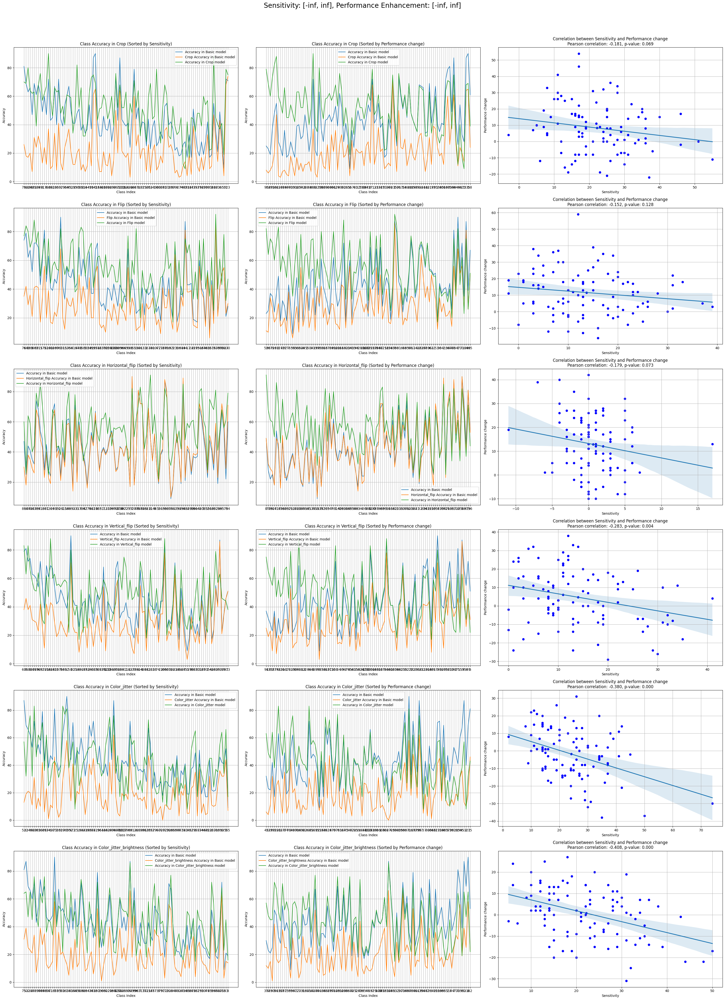

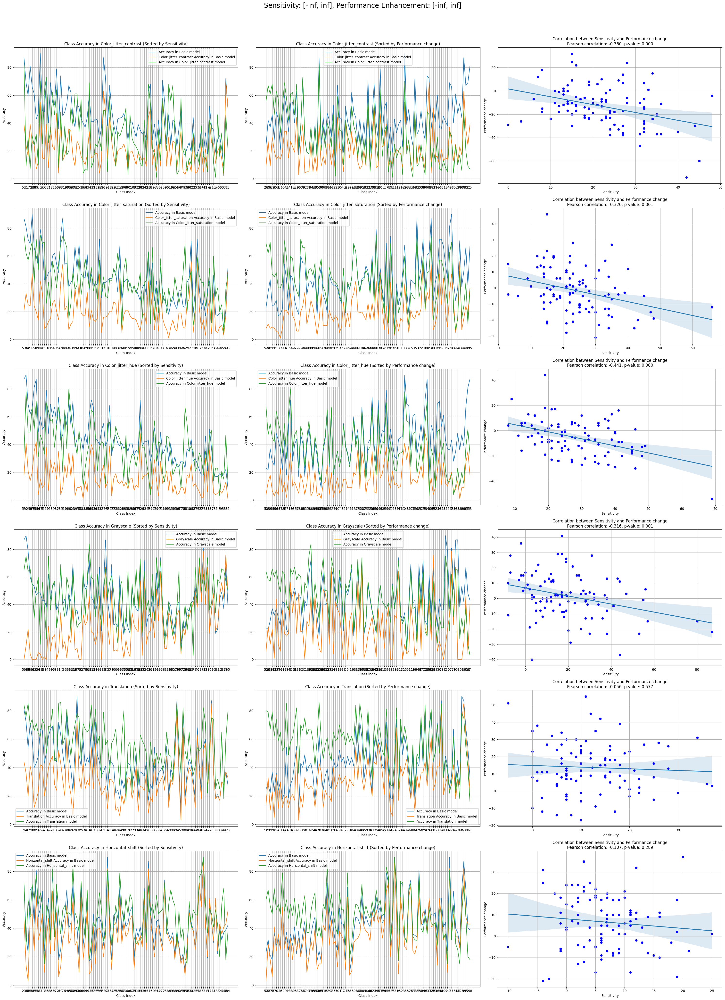

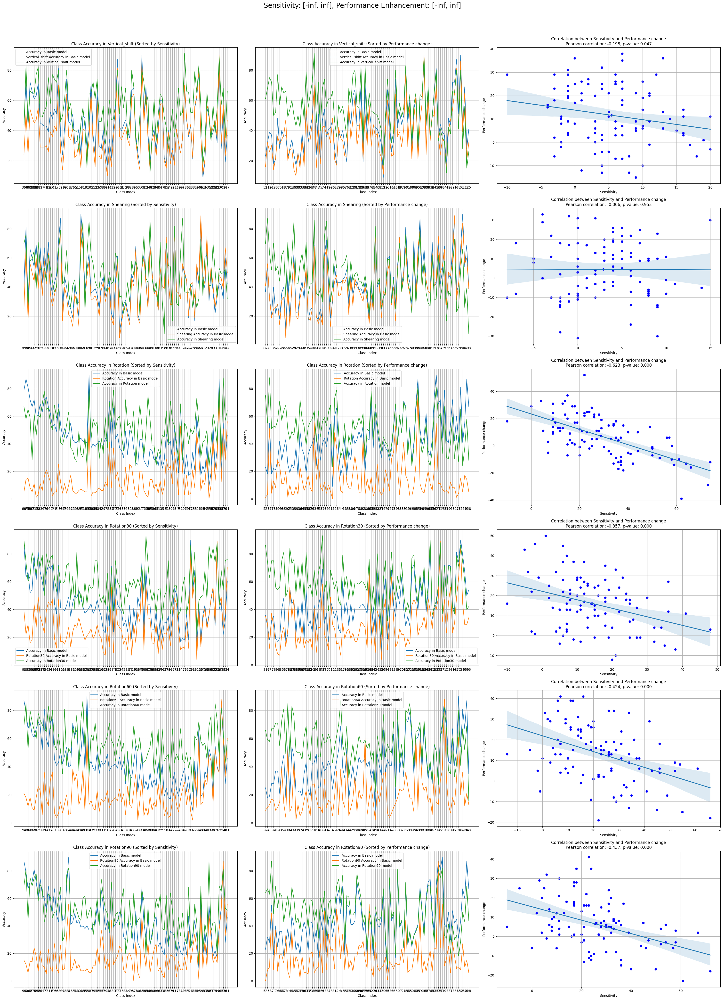

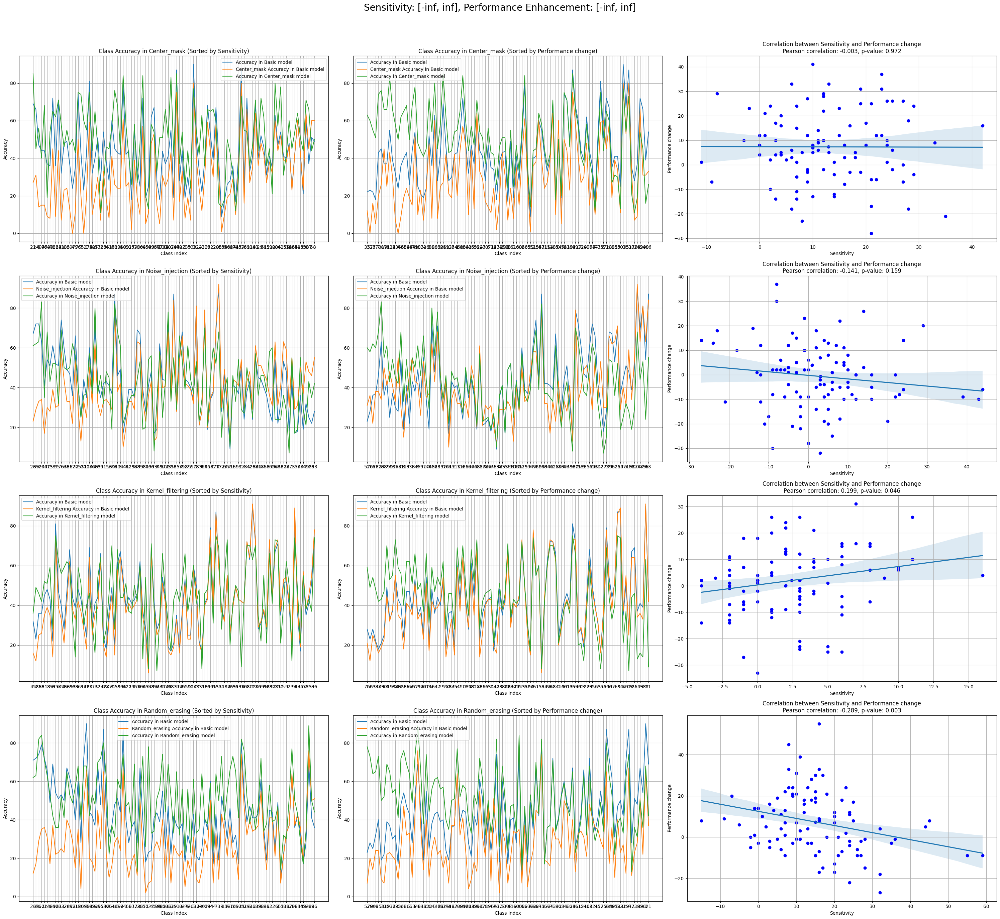

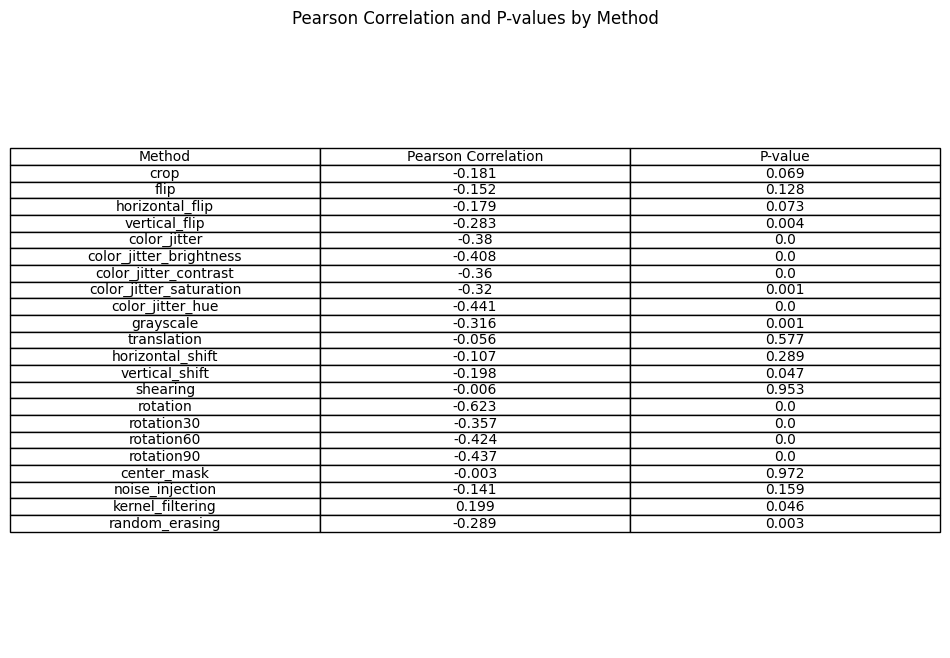

In [56]:
plot_class_accuracy(merged_results_path)

In [ ]:
plot_class_accuracy(merged_results_path,sensitivity_max=0)

In [ ]:
plot_class_accuracy(merged_results_path,sensitivity_min=0)

In [ ]:
plot_class_accuracy(merged_results_path,sensitivity_min=5,sensitivity_max=30)

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict

def analyze_sensitivity_performance(csv_file, methods, ranges):
    # CSV 파일 읽기
    df = pd.read_csv(csv_file)

    # 결과를 저장할 딕셔너리
    results = {name: {} for name, _, _, _ in ranges}
    counts = {name: {} for name, _, _, _ in ranges}
    best_ranges = {method: (None, None, None) for method in methods}
    best_classes = {method: ([], [], []) for method in methods}

    # 각 방법론 별로 조건에 맞는 클래스 필터링 및 평균 계산
    for method in methods:
        sensitivity_col = f'{method}_sensitivity'
        performance_col = f'{method}_performance_enhancement'
        
        for name, sensitivity_min, sensitivity_max, performance_min in ranges:
            # 조건에 맞는 클래스 필터링
            filtered_df = df[(df[sensitivity_col] >= sensitivity_min) & (df[sensitivity_col] <= sensitivity_max) & (df[performance_col] >= performance_min)]
            
            # 평균 계산
            avg_performance = filtered_df[performance_col].mean()
            
            # 결과 저장
            results[name][method] = avg_performance
            counts[name][method] = len(filtered_df)
            
            # 최고의 Performance Enhancement를 만들어낸 범위와 클래스 이름 저장
            if best_ranges[method][0] is None or avg_performance > results[best_ranges[method][0]][method]:
                best_ranges[method] = (name, best_ranges[method][0], best_ranges[method][1])
                best_classes[method] = (filtered_df['Class Name'].tolist(), best_classes[method][0], best_classes[method][1])
            elif best_ranges[method][1] is None or avg_performance > results[best_ranges[method][1]][method]:
                best_ranges[method] = (best_ranges[method][0], name, best_ranges[method][1])
                best_classes[method] = (best_classes[method][0], filtered_df['Class Name'].tolist(), best_classes[method][1])
            elif best_ranges[method][2] is None or avg_performance < results[best_ranges[method][2]][method]:
                best_ranges[method] = (best_ranges[method][0], best_ranges[method][1], name)
                best_classes[method] = (best_classes[method][0], best_classes[method][1], filtered_df['Class Name'].tolist())

    # 결과 출력 및 시각화
    methods_list = []
    avg_performance_lists = {name: [] for name, _, _, _ in ranges}
    count_lists = {name: [] for name, _, _, _ in ranges}

    for method in methods:
        methods_list.append(method.capitalize())
        for name in avg_performance_lists:
            avg_performance_lists[name].append(results[name][method])
            count_lists[name].append(counts[name][method])

    # 시각화
    x = range(len(methods_list))
    plt.figure(figsize=(15, 7))
    
    width = 0.8 / len(ranges)  # 막대 너비를 범위 개수에 맞게 조정
    for i, name in enumerate(avg_performance_lists):
        plt.bar([p + width * i for p in x], avg_performance_lists[name], width=width, label=f'{name} (Avg)')

    plt.xlabel('Methods')
    plt.ylabel('Performance Enhancement')
    plt.title('Comparison of Performance Enhancement Averages by Range of Sensitivity')
    plt.xticks([p + width * (len(ranges) - 1) / 2 for p in x], methods_list, rotation=45)
    plt.legend()
    plt.tight_layout()

    # 클래스 개수 표시
    for i, name in enumerate(count_lists):
        for j, count in enumerate(count_lists[name]):
            plt.text(j + width * i, avg_performance_lists[name][j] + 0.01, f'{count}', ha='center', va='bottom', fontsize=8)

    # 클래스 개수 주석 추가
    plt.annotate('Numbers above bars indicate the number of classes', 
                 xy=(0.5, 0.1), xycoords='axes fraction', ha='center', fontsize=10, color='red')

    plt.show()

    # 각 방법론에서 최고의 Performance Enhancement를 만들어낸 Sensitivity 범위와 클래스 이름 출력
    best_class_counts = defaultdict(int)
    lowest_class_counts = defaultdict(int)

    for method in methods:
        print(f"Method: {method.capitalize()}")
        print(f"Best Sensitivity Range: {best_ranges[method][0]}")
        print(f"Classes: {', '.join(best_classes[method][0])}")
        for cls in best_classes[method][0]:
            best_class_counts[cls] += 1
        print(f"Second Best Sensitivity Range: {best_ranges[method][1]}")
        print(f"Classes: {', '.join(best_classes[method][1])}")
        for cls in best_classes[method][1]:
            best_class_counts[cls] += 1
        print(f"Lowest Performance Sensitivity Range: {best_ranges[method][2]}")
        print(f"Classes: {', '.join(best_classes[method][2])}")
        for cls in best_classes[method][2]:
            lowest_class_counts[cls] += 1
        print("\n" + "-"*80 + "\n")

    # 각 클래스가 best와 lowest에 몇 번 나왔는지 출력
    print("Class counts in best ranges:")
    for cls, count in best_class_counts.items():
        print(f"{cls}: {count} times")

    print("\nClass counts in lowest ranges:")
    for cls, count in lowest_class_counts.items():
        print(f"{cls}: {count} times")

# 함수 호출 예시
csv_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivitiy&performance.csv'
methods = ['crop', 'flip','horizontal_flip','vertical_flip', 'color_jitter', 'grayscale', 'translation', 'shearing', 'rotation','rotation30','rotation60','rotation90', 'center_mask', 'noise_injection', 'kernel_filtering', 'random_erasing']

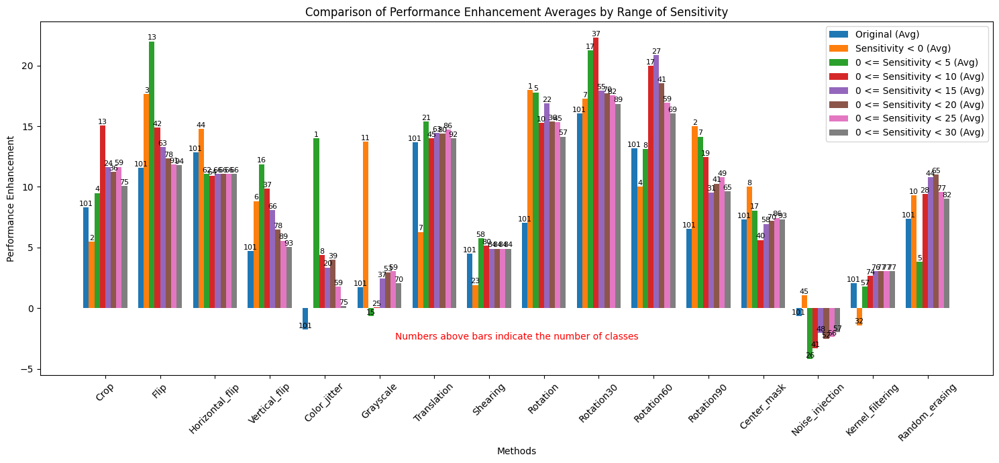

Method: Crop
Best Sensitivity Range: 0 <= Sensitivity < 10
Classes: bear, forest, girl, otter, pear, rabbit, ray, sea, snail, sunflower, sweet_pepper, tulip, turtle
Second Best Sensitivity Range: 0 <= Sensitivity < 25
Classes: baby, bear, beaver, bed, bowl, boy, bridge, butterfly, camel, can, caterpillar, clock, couch, crab, crocodile, dinosaur, dolphin, elephant, forest, girl, hamster, house, kangaroo, lion, lizard, lobster, man, mouse, oak_tree, orange, otter, palm_tree, pear, pine_tree, plain, porcupine, rabbit, raccoon, ray, rose, sea, seal, shark, shrew, snail, snake, spider, squirrel, sunflower, sweet_pepper, table, tiger, train, trout, tulip, turtle, woman, worm, Total_Accuracy
Lowest Performance Sensitivity Range: 0 <= Sensitivity < 30
Classes: apple, baby, bear, beaver, bed, bottle, bowl, boy, bridge, bus, butterfly, camel, can, caterpillar, clock, couch, crab, crocodile, dinosaur, dolphin, elephant, flatfish, forest, fox, girl, hamster, house, kangaroo, lamp, leopard, lion, l

In [18]:
# methods = ['crop', 'flip', 'rotation']
ranges = [
    ('Original',-999,999,-999),
    ('Sensitivity < 0',-999,0,-999),
    ('0 <= Sensitivity < 5',0,5,-999),
    ('0 <= Sensitivity < 10',0,10,-999),
    ('0 <= Sensitivity < 15',0,15,-999),
    ('0 <= Sensitivity < 20',0,20,-999),
    ('0 <= Sensitivity < 25',0,25,-999),
    ('0 <= Sensitivity < 30',0,30,-999),
]
analyze_sensitivity_performance(csv_file, methods, ranges)

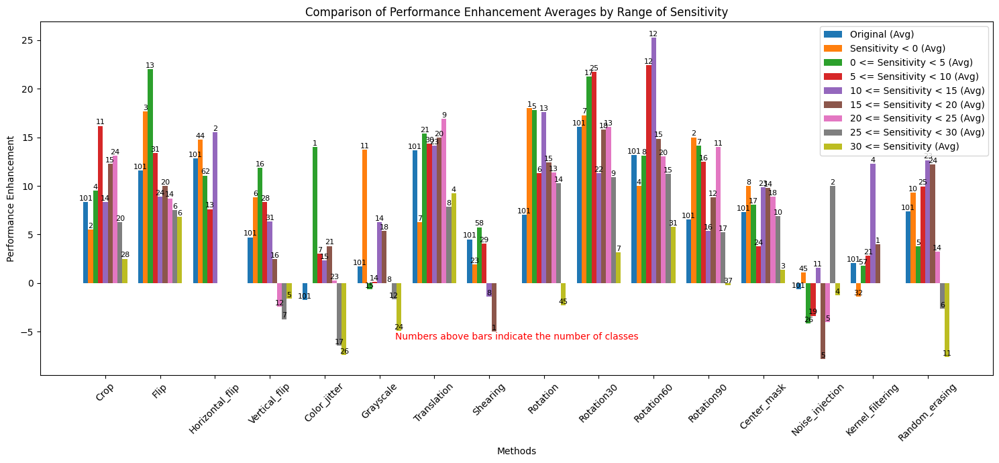

Method: Crop
Best Sensitivity Range: 5 <= Sensitivity < 10
Classes: bear, forest, girl, otter, pear, rabbit, ray, snail, sunflower, sweet_pepper, turtle
Second Best Sensitivity Range: 20 <= Sensitivity < 25
Classes: bed, bridge, butterfly, camel, can, caterpillar, clock, couch, crab, dinosaur, dolphin, kangaroo, lion, palm_tree, porcupine, raccoon, shark, spider, table, tiger, train, trout, worm, Total_Accuracy
Lowest Performance Sensitivity Range: 30 <= Sensitivity
Classes: aquarium_fish, bee, beetle, bicycle, bottle, castle, cattle, chair, chimpanzee, cockroach, cup, keyboard, lamp, lawn_mower, motorcycle, mountain, orchid, pickup_truck, plate, road, rocket, skunk, streetcar, telephone, tractor, wardrobe, willow_tree, wolf

--------------------------------------------------------------------------------

Method: Flip
Best Sensitivity Range: 0 <= Sensitivity < 5
Classes: can, crab, crocodile, girl, lobster, orchid, otter, plate, poppy, rose, spider, sunflower, television
Second Best S

In [19]:
# methods = ['crop', 'flip', 'rotation']
ranges = [
    ('Original',-999,999,-999),
    ('Sensitivity < 0',-999,0,-999),
    ('0 <= Sensitivity < 5',0,5,-999),
    ('5 <= Sensitivity < 10',5,10,-999),
    ('10 <= Sensitivity < 15',10,15,-999),
    ('15 <= Sensitivity < 20',15,20,-999),
    ('20 <= Sensitivity < 25',20,25,-999),
    ('25 <= Sensitivity < 30',25,30,-999),
    ('30 <= Sensitivity',30,999,-999),
]
analyze_sensitivity_performance(csv_file, methods, ranges)

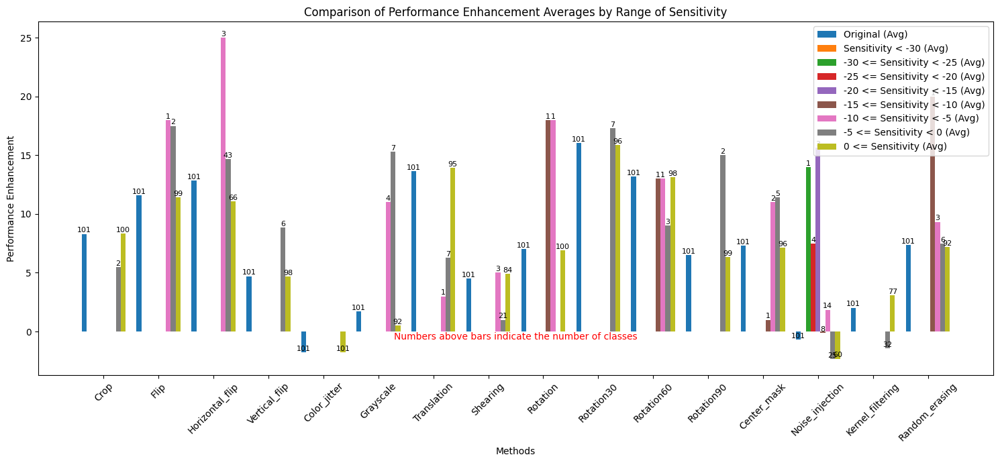

Method: Crop
Best Sensitivity Range: 0 <= Sensitivity
Classes: apple, aquarium_fish, baby, bear, beaver, bed, bee, beetle, bicycle, bottle, bowl, boy, bridge, bus, butterfly, camel, can, castle, caterpillar, cattle, chair, chimpanzee, clock, cockroach, couch, crab, crocodile, cup, dinosaur, dolphin, elephant, flatfish, forest, fox, girl, hamster, house, kangaroo, keyboard, lamp, lawn_mower, leopard, lion, lizard, lobster, man, maple_tree, motorcycle, mountain, mouse, mushroom, oak_tree, orange, orchid, otter, palm_tree, pear, pickup_truck, pine_tree, plain, plate, poppy, porcupine, possum, rabbit, raccoon, ray, road, rocket, rose, sea, seal, shark, shrew, skunk, skyscraper, snail, snake, spider, squirrel, streetcar, sunflower, sweet_pepper, table, tank, telephone, television, tiger, tractor, train, trout, tulip, turtle, wardrobe, whale, willow_tree, wolf, woman, worm, Total_Accuracy
Second Best Sensitivity Range: Original
Classes: apple, aquarium_fish, baby, bear, beaver, bed, bee, bee

In [21]:
# methods = ['crop', 'flip', 'rotation']
ranges = [
    ('Original',-999,999,-999),
    ('Sensitivity < -30',-999,-30,-999),
    ('-30 <= Sensitivity < -25',-30,-25,-999),
    ('-25 <= Sensitivity < -20',-25,-20,-999),
    ('-20 <= Sensitivity < -15',-20,-15,-999),
    ('-15 <= Sensitivity < -10',-15,-10,-999),
    ('-10 <= Sensitivity < -5',-10,-5,-999),
    ('-5 <= Sensitivity < 0',-5,0,-999),
    ('0 <= Sensitivity',0,999,-999),
]
analyze_sensitivity_performance(csv_file, methods, ranges)

In [108]:
import pandas as pd

# CSV 파일 경로
input_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results.csv'
output_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivity&performance.csv'

# CSV 파일 읽기
df = pd.read_csv(input_file)

# 삭제할 열
columns_to_drop = ['Cluster', 'aug_original']

# 열 삭제
df.drop(columns=columns_to_drop, inplace=True)

# 방법론 목록
methods = ['crop', 'flip', 'color_jitter', 'grayscale', 'translation', 'shearing', 'rotation', 'center_mask', 'noise_injection', 'kernel_filtering', 'random_erasing']

# sensitivity와 performance enhancement 계산 및 추가
for method in methods:
    df[f'{method}_sensitivity'] = df['original'] - df[method]
    df[f'{method}_performance_enhancement'] = df[f'aug_{method}'] - df['original']

# 새로운 CSV 파일로 저장
df.to_csv(output_file, index=False)

print(f"New CSV file with sensitivity and performance enhancement saved to {output_file}")

New CSV file with sensitivity and performance enhancement saved to /hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivity&performance.csv


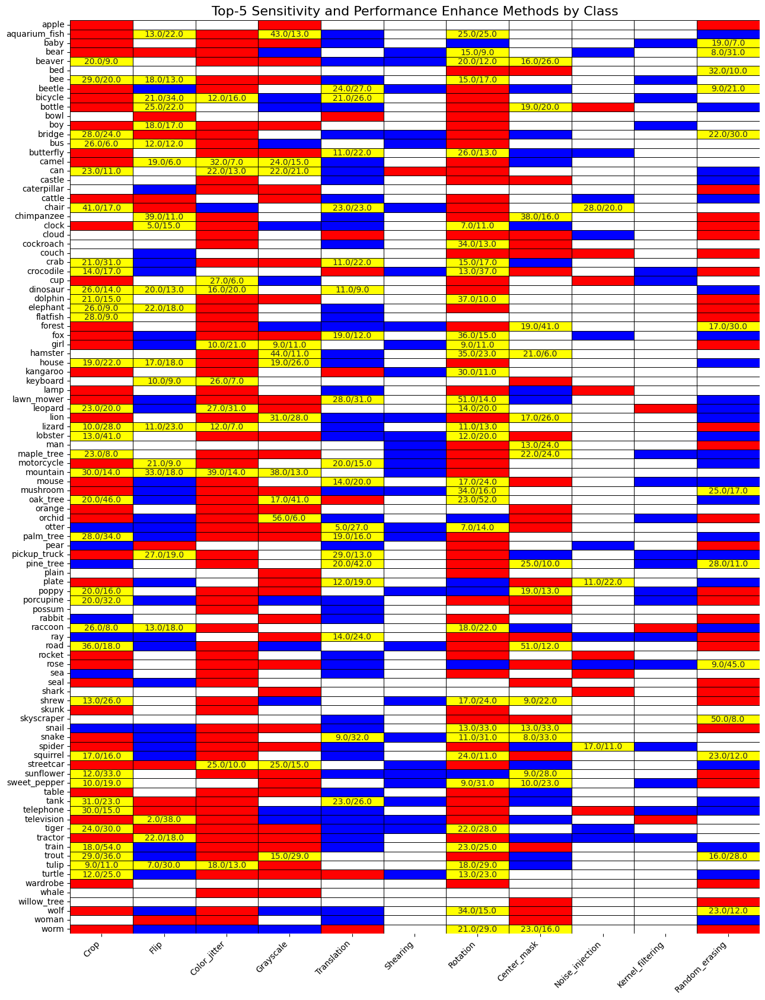

Yellow Combinations and Corresponding Classes:
Class Index: 1, Class Name: aquarium_fish, Methods: flip, grayscale, rotation
Class Index: 2, Class Name: baby, Methods: random_erasing
Class Index: 3, Class Name: bear, Methods: rotation, random_erasing
Class Index: 4, Class Name: beaver, Methods: crop, rotation, center_mask
Class Index: 5, Class Name: bed, Methods: random_erasing
Class Index: 6, Class Name: bee, Methods: crop, flip, rotation
Class Index: 7, Class Name: beetle, Methods: translation, random_erasing
Class Index: 8, Class Name: bicycle, Methods: flip, color_jitter, translation
Class Index: 9, Class Name: bottle, Methods: flip, center_mask
Class Index: 11, Class Name: boy, Methods: flip
Class Index: 12, Class Name: bridge, Methods: crop, random_erasing
Class Index: 13, Class Name: bus, Methods: crop, flip
Class Index: 14, Class Name: butterfly, Methods: translation, rotation
Class Index: 15, Class Name: camel, Methods: flip, color_jitter, grayscale
Class Index: 16, Class Name

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# CSV 파일 경로
merged_results_path = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results.csv'

# CSV 파일 읽기
df = pd.read_csv(merged_results_path)

# Augmentation 방법 목록
augmentations = ['crop', 'flip', 'color_jitter', 'grayscale', 'translation', 'shearing', 'rotation', 'center_mask', 'noise_injection', 'kernel_filtering', 'random_erasing']

# 각 클래스에 대해 sensitivity와 performance_enhance 계산
for aug in augmentations:
    df[f'{aug}_sensitivity'] = df['original'] - df[aug]
    df[f'{aug}_performance_enhance'] = df[f'aug_{aug}'] - df['original']

# 모든 클래스에 대해 top-5 sensitivity와 top-5 performance_enhance 방법론 출력
sensitivity_results = {}
performance_enhance_results = {}

for class_index in range(100):
    class_data = df[df['Class Index'] == class_index]
    class_name = class_data['Class Name'].values[0]
    
    # sensitivity 정렬
    sensitivity_scores = {aug: class_data[f'{aug}_sensitivity'].values[0] for aug in augmentations}
    sorted_sensitivity = sorted(sensitivity_scores.items(), key=lambda item: item[1], reverse=True)[:5]
    sensitivity_results[class_index] = sorted_sensitivity
    
    # performance_enhance 정렬
    performance_enhance_scores = {aug: class_data[f'{aug}_performance_enhance'].values[0] for aug in augmentations}
    sorted_performance_enhance = sorted(performance_enhance_scores.items(), key=lambda item: item[1], reverse=True)[:5]
    performance_enhance_results[class_index] = sorted_performance_enhance

# 시각화를 위한 데이터 준비
visualization_data = np.zeros((100, len(augmentations)), dtype=int)
annotations = np.full((100, len(augmentations)), '', dtype=object)
yellow_combinations = {}

for class_index in range(100):
    sensitivity_methods = set([aug for aug, _ in sensitivity_results[class_index]])
    performance_enhance_methods = set([aug for aug, _ in performance_enhance_results[class_index]])
    overlapping_methods = sensitivity_methods.intersection(performance_enhance_methods)
    
    for i, aug in enumerate(augmentations):
        if aug in overlapping_methods:
            sensitivity_value = df.loc[df['Class Index'] == class_index, f'{aug}_sensitivity'].values[0]
            performance_enhance_value = df.loc[df['Class Index'] == class_index, f'{aug}_performance_enhance'].values[0]
            if performance_enhance_value > 5:
                visualization_data[class_index, i] = 3  # 노란색
                annotations[class_index, i] = f'{sensitivity_value:.1f}/{performance_enhance_value:.1f}'
                if class_index not in yellow_combinations:
                    yellow_combinations[class_index] = []
                yellow_combinations[class_index].append(aug)
        elif aug in sensitivity_methods:
            visualization_data[class_index, i] = 1  # 빨간색
        elif aug in performance_enhance_methods:
            performance_enhance_value = df.loc[df['Class Index'] == class_index, f'{aug}_performance_enhance'].values[0]
            if performance_enhance_value > 5:
                visualization_data[class_index, i] = 2  # 파란색

# 시각화
fig, ax = plt.subplots(figsize=(15, 20))
cmap = sns.color_palette(["white", "red", "blue", "yellow"])

sns.heatmap(visualization_data, cmap=cmap, cbar=False, ax=ax, linewidths=.5, linecolor='black', annot=annotations, fmt='')

# 축 레이블 설정
ax.set_xticks(np.arange(len(augmentations)) + 0.5)
ax.set_xticklabels([aug.capitalize() for aug in augmentations], rotation=45, ha='right')
ax.set_yticks(np.arange(100) + 0.5)
ax.set_yticklabels(df['Class Name'].head(100), rotation=0)

# 제목 설정
ax.set_title('Top-5 Sensitivity and Performance Enhance Methods by Class', fontsize=16)

plt.show()

# 노란색으로 칠해진 열 조합과 해당 클래스들 출력
print("Yellow Combinations and Corresponding Classes:")
for class_index, methods in yellow_combinations.items():
    class_name = df.loc[df['Class Index'] == class_index, 'Class Name'].values[0]
    print(f"Class Index: {class_index}, Class Name: {class_name}, Methods: {', '.join(methods)}")

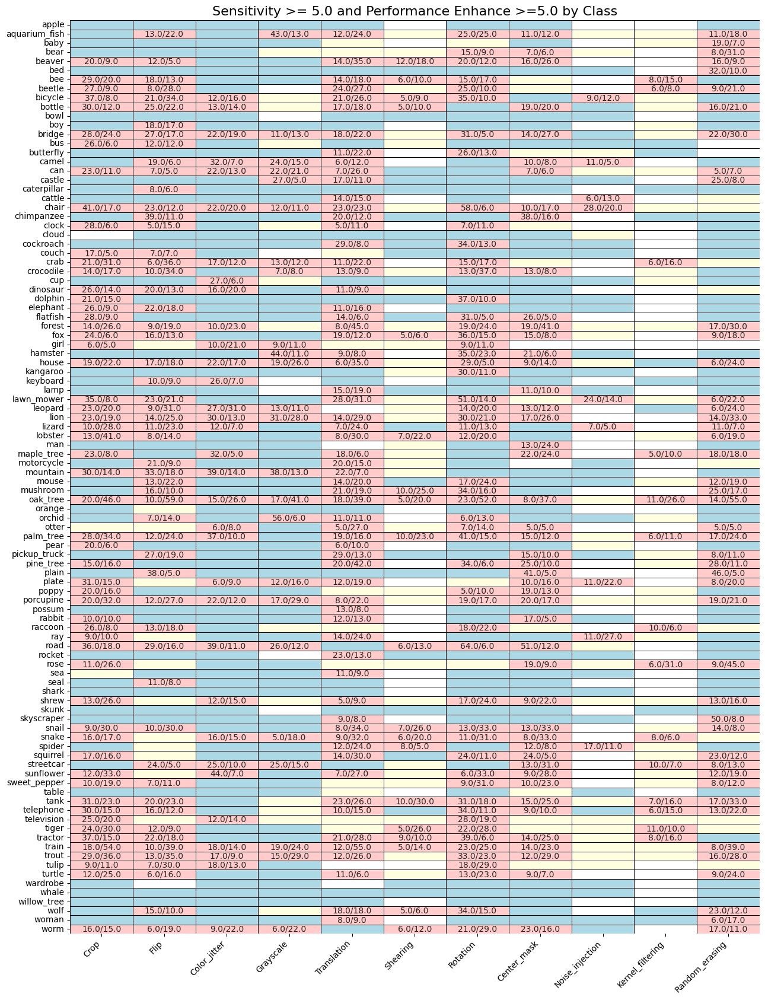

Yellow Combinations and Corresponding Classes:
Methods: flip
Class Indices: [1, 4, 6, 7, 8, 9, 11, 12, 13, 15, 16, 18, 20, 21, 22, 25, 26, 27, 29, 31, 33, 34, 37, 39, 41, 42, 43, 44, 45, 48, 49, 50, 51, 52, 54, 56, 58, 60, 63, 66, 68, 72, 77, 81, 83, 85, 86, 88, 89, 90, 91, 92, 93, 97, 99]

Methods: grayscale
Class Indices: [1, 12, 15, 16, 17, 20, 26, 27, 35, 36, 37, 42, 43, 49, 52, 54, 61, 63, 68, 78, 81, 90, 91, 99]

Methods: translation
Class Indices: [1, 4, 6, 7, 8, 9, 12, 14, 15, 16, 17, 19, 20, 21, 22, 24, 26, 27, 29, 31, 32, 33, 34, 36, 37, 40, 41, 43, 44, 45, 47, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 61, 63, 64, 65, 67, 69, 71, 74, 76, 77, 78, 79, 80, 82, 85, 86, 89, 90, 91, 93, 97, 98]

Methods: rotation
Class Indices: [1, 3, 4, 6, 7, 8, 12, 14, 20, 22, 24, 26, 27, 30, 32, 33, 34, 35, 36, 37, 38, 41, 42, 43, 44, 45, 50, 51, 52, 54, 55, 56, 59, 62, 63, 66, 68, 74, 77, 78, 80, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 97, 99]

Methods: center_mask
Class Indices: [1, 3, 4

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# CSV 파일 경로
merged_results_path = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results.csv'

# CSV 파일 읽기
df = pd.read_csv(merged_results_path)

# Augmentation 방법 목록
augmentations = ['crop', 'flip', 'color_jitter', 'grayscale', 'translation', 'shearing', 'rotation', 'center_mask', 'noise_injection', 'kernel_filtering', 'random_erasing']

# 각 클래스에 대해 sensitivity와 performance_enhance 계산
for aug in augmentations:
    df[f'{aug}_sensitivity'] = df['original'] - df[aug]
    df[f'{aug}_performance_enhance'] = df[f'aug_{aug}'] - df['original']

# 시각화를 위한 데이터 준비
visualization_data = np.zeros((100, len(augmentations)), dtype=int)
annotations = np.full((100, len(augmentations)), '', dtype=object)
yellow_combinations = {}

for class_index in range(100):
    for i, aug in enumerate(augmentations):
        sensitivity_value = df.loc[df['Class Index'] == class_index, f'{aug}_sensitivity'].values[0]
        performance_enhance_value = df.loc[df['Class Index'] == class_index, f'{aug}_performance_enhance'].values[0]
        
        if sensitivity_value >= 5.0 and performance_enhance_value >= 5.0:
            visualization_data[class_index, i] = 3  # 노란색
            annotations[class_index, i] = f'{sensitivity_value:.1f}/{performance_enhance_value:.1f}'
            methods_tuple = tuple(sorted([aug]))
            if methods_tuple not in yellow_combinations:
                yellow_combinations[methods_tuple] = []
            yellow_combinations[methods_tuple].append(class_index)
        elif sensitivity_value >= 5.0:
            visualization_data[class_index, i] = 1  # 빨간색
        elif performance_enhance_value >= 5.0:
            visualization_data[class_index, i] = 2  # 파란색

# 시각화
fig, ax = plt.subplots(figsize=(15, 20))
cmap = sns.color_palette(["white", "#add8e6", "#ffffe0", "#ffcccb"]) # 흰색, 연파란색, 연노란색, 연빨간색

sns.heatmap(visualization_data, cmap=cmap, cbar=False, ax=ax, linewidths=.5, linecolor='black', annot=annotations, fmt='')

# 축 레이블 설정
ax.set_xticks(np.arange(len(augmentations)) + 0.5)
ax.set_xticklabels([aug.capitalize() for aug in augmentations], rotation=45, ha='right')
ax.set_yticks(np.arange(100) + 0.5)
ax.set_yticklabels(df['Class Name'].head(100), rotation=0)

# 제목 설정
ax.set_title('Sensitivity >= 5.0 and Performance Enhance >=5.0 by Class', fontsize=16)

plt.show()

# 노란색으로 칠해진 열 조합과 해당 클래스들 출력
print("Yellow Combinations and Corresponding Classes:")
for methods, class_indices in yellow_combinations.items():
    print(f"Methods: {', '.join(methods)}")
    print(f"Class Indices: {class_indices}")
    print()

In [22]:
import pandas as pd

# CSV 파일 경로
csv_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivitiy&performance.csv'

# CSV 파일 읽기
df = pd.read_csv(csv_file)

# Augmentation 방법 목록
augmentations = ['crop', 'flip', 'horizontal_flip', 'vertical_flip', 'color_jitter', 'grayscale', 'translation', 'shearing', 'rotation', 'rotation30', 'rotation60', 'rotation90', 'center_mask', 'noise_injection', 'kernel_filtering', 'random_erasing']

# 각 클래스에 대해 top-5 performance enhancement 방법론과 그 수치 추출
top5_performance_enhancement = {}

for class_index in df['Class Index'].unique():
    class_data = df[df['Class Index'] == class_index]
    class_name = class_data['Class Name'].values[0]
    
    # performance enhancement 정렬
    performance_enhance_scores = {aug: class_data[f'{aug}_performance_enhancement'].values[0] for aug in augmentations}
    sorted_performance_enhance = sorted(performance_enhance_scores.items(), key=lambda item: item[1], reverse=True)[:5]
    
    top5_performance_enhancement[class_name] = sorted_performance_enhance

# 결과 출력
for class_name, enhancements in top5_performance_enhancement.items():
    print(f"Class: {class_name}")
    for aug, value in enhancements:
        print(f"  {aug.capitalize()}: {value:.2f}")
    print()

Class: apple
  Rotation30: -4.00
  Flip: -8.00
  Horizontal_flip: -8.00
  Rotation90: -8.00
  Color_jitter: -9.00

Class: aquarium_fish
  Vertical_flip: 25.00
  Rotation: 25.00
  Rotation30: 25.00
  Translation: 24.00
  Rotation60: 24.00

Class: baby
  Rotation60: 33.00
  Rotation90: 29.00
  Translation: 16.00
  Rotation: 10.00
  Kernel_filtering: 10.00

Class: bear
  Rotation30: 37.00
  Random_erasing: 31.00
  Rotation60: 25.00
  Rotation90: 18.00
  Grayscale: 15.00

Class: beaver
  Translation: 35.00
  Center_mask: 26.00
  Rotation90: 22.00
  Rotation60: 19.00
  Shearing: 18.00

Class: bed
  Horizontal_flip: 10.00
  Random_erasing: 10.00
  Grayscale: 4.00
  Color_jitter: 2.00
  Crop: 1.00

Class: bee
  Rotation30: 29.00
  Rotation60: 29.00
  Rotation90: 21.00
  Crop: 20.00
  Translation: 18.00

Class: beetle
  Center_mask: 31.00
  Flip: 28.00
  Translation: 27.00
  Rotation60: 26.00
  Random_erasing: 21.00

Class: bicycle
  Horizontal_flip: 42.00
  Flip: 34.00
  Translation: 26.00
  

/tmp/ipykernel_1144564/143655790.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Average Performance Enhancement', y='Augmentation Method', data=avg_performance_df, palette='viridis')


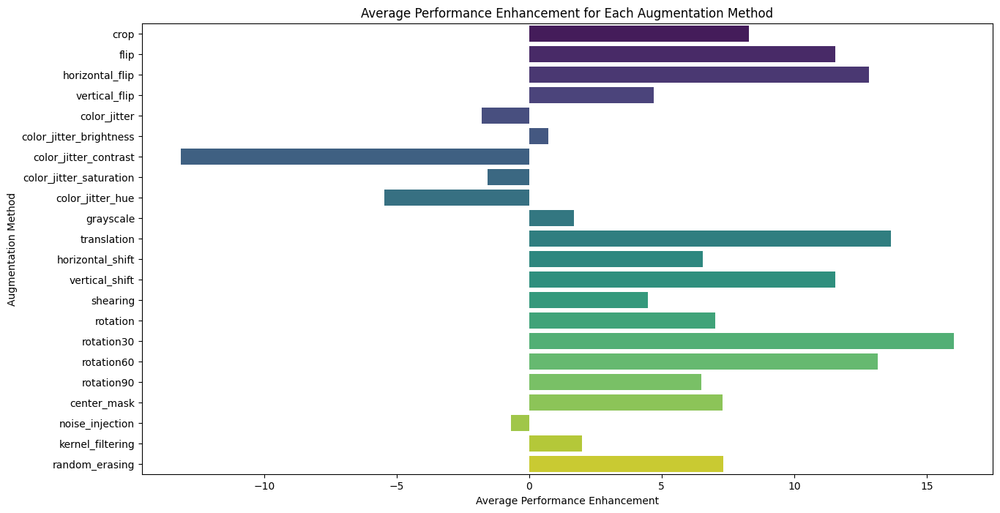

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# CSV 파일 경로
csv_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivitiy&performance.csv'

# CSV 파일 읽기
df = pd.read_csv(csv_file)

# Augmentation 방법 목록
augmentations = ['crop', 'flip', 'horizontal_flip', 'vertical_flip', 'color_jitter', 'color_jitter_brightness', 'color_jitter_contrast', 'color_jitter_saturation', 'color_jitter_hue', 'grayscale', 'translation', 'horizontal_shift', 'vertical_shift',  'shearing', 'rotation', 'rotation30', 'rotation60', 'rotation90', 'center_mask', 'noise_injection', 'kernel_filtering', 'random_erasing']

# 각 방법론 별 performance enhancement의 평균 계산
avg_performance_enhancement = {aug: df[f'{aug}_performance_enhancement'].mean() for aug in augmentations}

# 데이터프레임 생성
avg_performance_df = pd.DataFrame(list(avg_performance_enhancement.items()), columns=['Augmentation Method', 'Average Performance Enhancement'])

# 시각화
plt.figure(figsize=(15, 8))
sns.barplot(x='Average Performance Enhancement', y='Augmentation Method', data=avg_performance_df, palette='viridis')
plt.title('Average Performance Enhancement for Each Augmentation Method')
plt.xlabel('Average Performance Enhancement')
plt.ylabel('Augmentation Method')
plt.show()

/tmp/ipykernel_975866/2321616993.py:26: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data = heatmap_data.fillna(0)


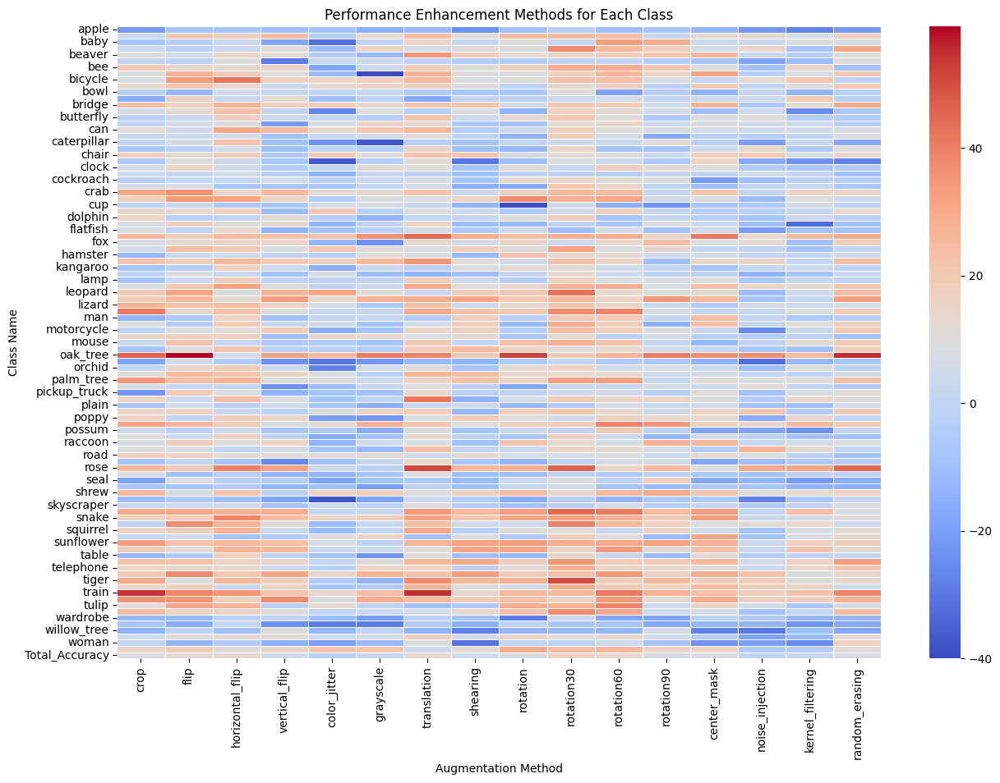

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# CSV 파일 경로
csv_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivitiy&performance.csv'

# CSV 파일 읽기
df = pd.read_csv(csv_file)

# Augmentation 방법 목록
augmentations = ['crop', 'flip', 'horizontal_flip', 'vertical_flip', 'color_jitter', 'grayscale', 'translation', 'shearing', 'rotation', 'rotation30', 'rotation60', 'rotation90', 'center_mask', 'noise_injection', 'kernel_filtering', 'random_erasing']

# Heatmap을 위한 데이터프레임 생성
heatmap_data = pd.DataFrame(index=df['Class Name'], columns=augmentations)

for class_index in df['Class Index'].unique():
    class_data = df[df['Class Index'] == class_index]
    class_name = class_data['Class Name'].values[0]
    
    # 모든 performance enhancement 값 채우기
    for aug in augmentations:
        heatmap_data.at[class_name, aug] = class_data[f'{aug}_performance_enhancement'].values[0]

# NaN 값을 0으로 대체
heatmap_data = heatmap_data.fillna(0)

# Heatmap 시각화
plt.figure(figsize=(15, 10))
sns.heatmap(heatmap_data, annot=False, cmap='coolwarm', linewidths=.5)
plt.title('Performance Enhancement Methods for Each Class')
plt.xlabel('Augmentation Method')
plt.ylabel('Class Name')
plt.show()

/tmp/ipykernel_1144564/3840438388.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data = heatmap_data.fillna(0)
/tmp/ipykernel_1144564/3840438388.py:65: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Rectangle((0, y), 1, 1, fill=True, color='white', edgecolor='gray', lw=0.5))


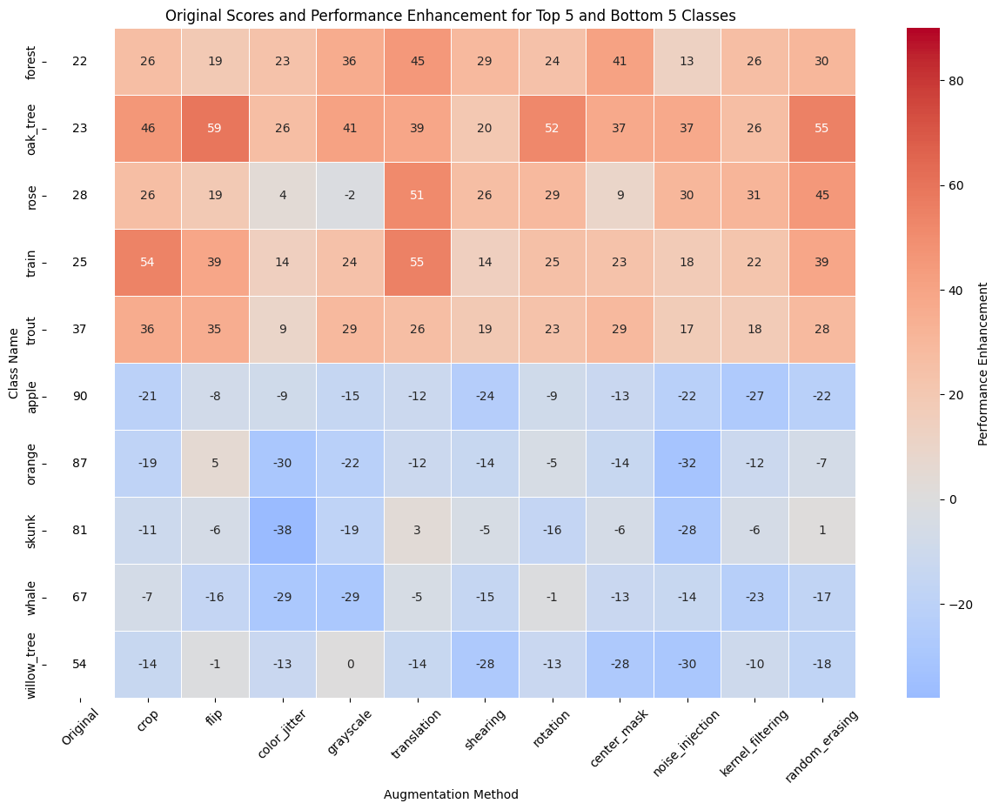

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# CSV 파일 경로
csv_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivitiy&performance.csv'

# CSV 파일 읽기
df = pd.read_csv(csv_file)

# Augmentation 방법 목록
augmentations = ['crop', 'flip', 'color_jitter', 'grayscale', 'translation', 'shearing', 'rotation', 'center_mask', 'noise_injection', 'kernel_filtering', 'random_erasing']

# Heatmap을 위한 데이터프레임 생성
heatmap_data = pd.DataFrame(index=df['Class Name'], columns=augmentations)

for class_index in df['Class Index'].unique():
    class_data = df[df['Class Index'] == class_index]
    class_name = class_data['Class Name'].values[0]
    
    # 모든 performance enhancement 값 채우기
    for aug in augmentations:
        
        heatmap_data.at[class_name, aug] = class_data[f'{aug}_performance_enhancement'].values[0]

# NaN 값을 0으로 대체
heatmap_data = heatmap_data.fillna(0)

# 클래스의 평균 performance enhancement 계산
heatmap_data['Average'] = heatmap_data.mean(axis=1)

# 평균 performance enhancement 기준으로 정렬
heatmap_data = heatmap_data.sort_values(by='Average', ascending=False)

# Top 5 및 Bottom 5 클래스 선택
top5_classes = heatmap_data.head(5).index
bottom5_classes = heatmap_data.tail(5).index

# 'Average' 열 제거
heatmap_data = heatmap_data.drop(columns=['Average'])

# Top 5 및 Bottom 5 클래스의 original 점수와 performance enhancement 추출
top5_data = df[df['Class Name'].isin(top5_classes)][['Class Name', 'original'] + [f'{aug}_performance_enhancement' for aug in augmentations]]
bottom5_data = df[df['Class Name'].isin(bottom5_classes)][['Class Name', 'original'] + [f'{aug}_performance_enhancement' for aug in augmentations]]

# 데이터프레임 병합
combined_data = pd.concat([top5_data, bottom5_data])

# 히트맵용 데이터 준비 (original 포함)
heatmap_with_original = combined_data.set_index('Class Name')
heatmap_with_original.rename(columns={'original': 'Original'}, inplace=True)

# '_performance_enhancement' 제거하여 컬럼 이름 간소화
new_columns = ['Original'] + augmentations
heatmap_with_original.columns = new_columns

# 시각화
plt.figure(figsize=(15, 10))

# Heatmap 그리기 (기존 coolwarm 컬러맵 유지)
ax = sns.heatmap(heatmap_with_original, annot=True, cmap='coolwarm', center=0, linewidths=.5, cbar_kws={'label': 'Performance Enhancement'})

# Original 컬럼에 흰색 배경 적용
for y in range(heatmap_with_original.shape[0]):
    ax.add_patch(plt.Rectangle((0, y), 1, 1, fill=True, color='white', edgecolor='gray', lw=0.5))

# 텍스트 색상 조정 (Original 칼럼은 항상 검은색)
for text in ax.texts:
    pos = text.get_position()
    if pos[0] == 0.5:  # Original 컬럼에 해당하는 경우
        text.set_color('black')

# 타이틀 및 라벨 설정
plt.title('Original Scores and Performance Enhancement for Top 5 and Bottom 5 Classes')
plt.xlabel('Augmentation Method')
plt.ylabel('Class Name')
plt.xticks(rotation=45)  # X축 레이블 회전
plt.show()

/tmp/ipykernel_1144564/2856727137.py:26: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data = heatmap_data.fillna(0)


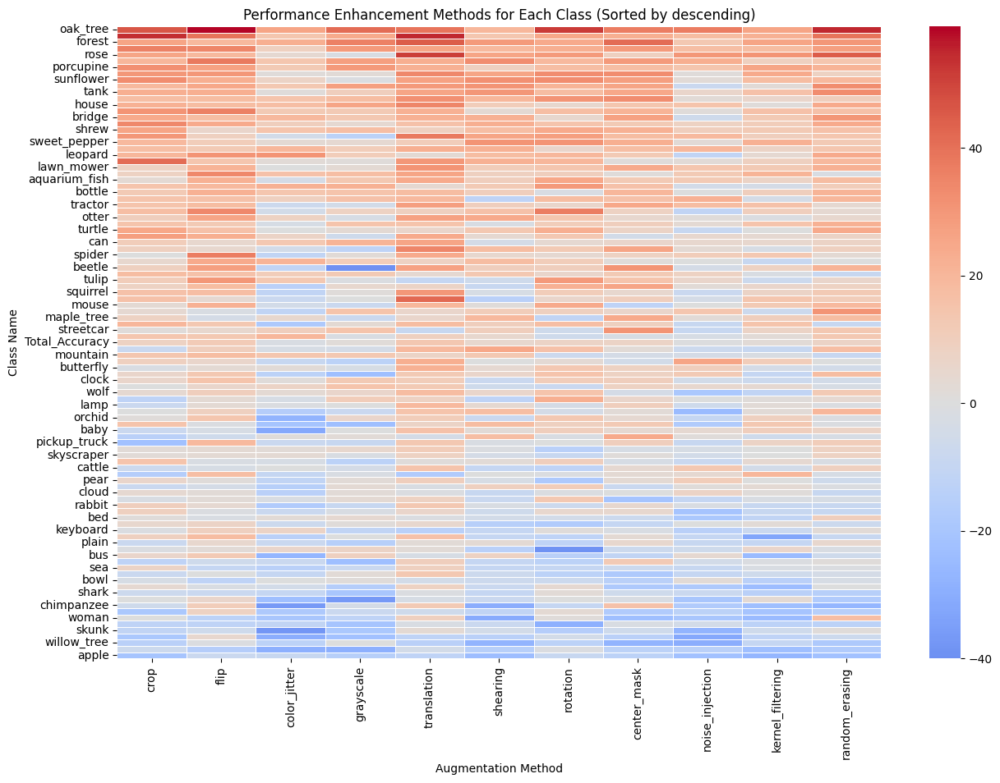

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# CSV 파일 경로
csv_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivitiy&performance.csv'

# CSV 파일 읽기
df = pd.read_csv(csv_file)

# Augmentation 방법 목록
augmentations = ['crop', 'flip', 'color_jitter', 'grayscale', 'translation', 'shearing', 'rotation', 'center_mask', 'noise_injection', 'kernel_filtering', 'random_erasing']

# Heatmap을 위한 데이터프레임 생성
heatmap_data = pd.DataFrame(index=df['Class Name'], columns=augmentations)

for class_index in df['Class Index'].unique():
    class_data = df[df['Class Index'] == class_index]
    class_name = class_data['Class Name'].values[0]
    
    # 모든 performance enhancement 값 채우기
    for aug in augmentations:
        heatmap_data.at[class_name, aug] = class_data[f'{aug}_performance_enhancement'].values[0]

# NaN 값을 0으로 대체
heatmap_data = heatmap_data.fillna(0)

# 클래스의 평균 performance enhancement 계산
heatmap_data['Average'] = heatmap_data.mean(axis=1)

# 평균 performance enhancement 기준으로 정렬
heatmap_data = heatmap_data.sort_values(by='Average', ascending=False)

# 'Average' 열 제거
heatmap_data = heatmap_data.drop(columns=['Average'])

# Heatmap 시각화
plt.figure(figsize=(15, 10))
sns.heatmap(heatmap_data, annot=False, cmap='coolwarm', center=0, linewidths=.5)
plt.title('Performance Enhancement Methods for Each Class (Sorted by descending)')
plt.xlabel('Augmentation Method')
plt.ylabel('Class Name')
plt.show()

/tmp/ipykernel_1084501/2472505311.py:26: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data = heatmap_data.fillna(0)


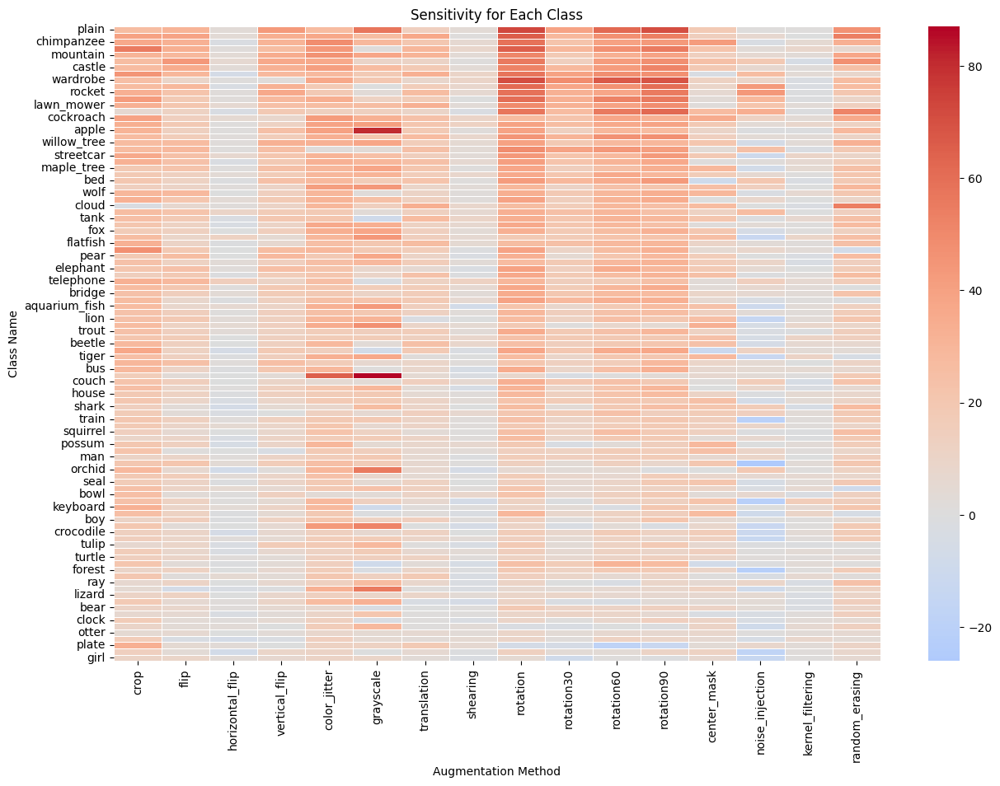

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# CSV 파일 경로
csv_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivitiy&performance.csv'

# CSV 파일 읽기
df = pd.read_csv(csv_file)

# Augmentation 방법 목록
augmentations = ['crop', 'flip', 'horizontal_flip', 'vertical_flip', 'color_jitter', 'grayscale', 'translation', 'shearing', 'rotation', 'rotation30', 'rotation60', 'rotation90', 'center_mask', 'noise_injection', 'kernel_filtering', 'random_erasing']

# Heatmap을 위한 데이터프레임 생성
heatmap_data = pd.DataFrame(index=df['Class Name'], columns=augmentations)

for class_index in df['Class Index'].unique():
    class_data = df[df['Class Index'] == class_index]
    class_name = class_data['Class Name'].values[0]
    
    # 모든 sensitivity 값 채우기
    for aug in augmentations:
        heatmap_data.at[class_name, aug] = class_data[f'{aug}_sensitivity'].values[0]

# NaN 값을 0으로 대체
heatmap_data = heatmap_data.fillna(0)

# 클래스의 평균 sensitivity 계산
heatmap_data['Average'] = heatmap_data.mean(axis=1)

# 평균 sensitivity 기준으로 정렬
heatmap_data = heatmap_data.sort_values(by='Average', ascending=False)

# 'Average' 열 제거
heatmap_data = heatmap_data.drop(columns=['Average'])

# Heatmap 시각화
plt.figure(figsize=(15, 10))
sns.heatmap(heatmap_data, annot=False, cmap='coolwarm', center=0, linewidths=.5)
plt.title('Sensitivity for Each Class')
plt.xlabel('Augmentation Method')
plt.ylabel('Class Name')
plt.show()

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_augmentations(csv_file, flip_augmentations, rotation_augmentations, flip_title, rotation_title):
    # CSV 파일 읽기
    df = pd.read_csv(csv_file)

    # Heatmap을 위한 데이터프레임 생성
    heatmap_data_perf_flip = pd.DataFrame(index=df['Class Name'], columns=flip_augmentations)
    heatmap_data_sens_flip = pd.DataFrame(index=df['Class Name'], columns=flip_augmentations)
    heatmap_data_perf_rotation = pd.DataFrame(index=df['Class Name'], columns=rotation_augmentations)
    heatmap_data_sens_rotation = pd.DataFrame(index=df['Class Name'], columns=rotation_augmentations)

    for class_index in df['Class Index'].unique():
        class_data = df[df['Class Index'] == class_index]
        class_name = class_data['Class Name'].values[0]

        # 모든 performance enhancement 값 채우기
        for aug in flip_augmentations:
            heatmap_data_perf_flip.at[class_name, aug] = class_data[f'{aug}_performance_enhancement'].values[0]
            heatmap_data_sens_flip.at[class_name, aug] = class_data[f'{aug}_sensitivity'].values[0]
        for aug in rotation_augmentations:
            heatmap_data_perf_rotation.at[class_name, aug] = class_data[f'{aug}_performance_enhancement'].values[0]
            heatmap_data_sens_rotation.at[class_name, aug] = class_data[f'{aug}_sensitivity'].values[0]

    # NaN 값을 0으로 대체
    heatmap_data_perf_flip = heatmap_data_perf_flip.fillna(0)
    heatmap_data_sens_flip = heatmap_data_sens_flip.fillna(0)
    heatmap_data_perf_rotation = heatmap_data_perf_rotation.fillna(0)
    heatmap_data_sens_rotation = heatmap_data_sens_rotation.fillna(0)

    # 입력한 방법론 리스트에서의 평균 performance enhancement 계산
    heatmap_data_perf_flip['Average'] = heatmap_data_perf_flip.mean(axis=1)
    heatmap_data_perf_rotation['Average'] = heatmap_data_perf_rotation.mean(axis=1)

    # 평균 performance enhancement 기준으로 정렬
    heatmap_data_perf_flip = heatmap_data_perf_flip.sort_values(by='Average', ascending=False)
    heatmap_data_sens_flip = heatmap_data_sens_flip.reindex(heatmap_data_perf_flip.index)
    heatmap_data_perf_rotation = heatmap_data_perf_rotation.sort_values(by='Average', ascending=False)
    heatmap_data_sens_rotation = heatmap_data_sens_rotation.reindex(heatmap_data_perf_rotation.index)

    # 'Average' 열 제거
    heatmap_data_perf_flip = heatmap_data_perf_flip.drop(columns=['Average'])
    heatmap_data_perf_rotation = heatmap_data_perf_rotation.drop(columns=['Average'])

    # Heatmap 시각화
    fig, axes = plt.subplots(2, 2, figsize=(20, 20))

    sns.heatmap(heatmap_data_perf_flip, annot=False, cmap='coolwarm', center=0, linewidths=.5, ax=axes[0, 0])
    axes[0, 0].set_title(f'Performance Enhancement - {flip_title} (Sorted by Performance Enhancement Average)')
    axes[0, 0].set_xlabel('Augmentation Method')
    axes[0, 0].set_ylabel('Class Name')

    sns.heatmap(heatmap_data_sens_flip, annot=False, cmap='coolwarm', center=0, linewidths=.5, ax=axes[0, 1])
    axes[0, 1].set_title(f'Sensitivity - {flip_title} (Sorted by Performance Enhancement Average)')
    axes[0, 1].set_xlabel('Augmentation Method')
    axes[0, 1].set_ylabel('Class Name')

    sns.heatmap(heatmap_data_perf_rotation, annot=False, cmap='coolwarm', center=0, linewidths=.5, ax=axes[1, 0])
    axes[1, 0].set_title(f'Performance Enhancement - {rotation_title} (Sorted by Performance Enhancement Average)')
    axes[1, 0].set_xlabel('Augmentation Method')
    axes[1, 0].set_ylabel('Class Name')

    sns.heatmap(heatmap_data_sens_rotation, annot=False, cmap='coolwarm', center=0, linewidths=.5, ax=axes[1, 1])
    axes[1, 1].set_title(f'Sensitivity - {rotation_title} (Sorted by Performance Enhancement Average)')
    axes[1, 1].set_xlabel('Augmentation Method')
    axes[1, 1].set_ylabel('Class Name')

    plt.tight_layout()
    plt.show()

/tmp/ipykernel_1084501/2901826234.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data_perf_flip = heatmap_data_perf_flip.fillna(0)
/tmp/ipykernel_1084501/2901826234.py:29: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data_sens_flip = heatmap_data_sens_flip.fillna(0)
/tmp/ipykernel_1084501/2901826234.py:30: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('fut

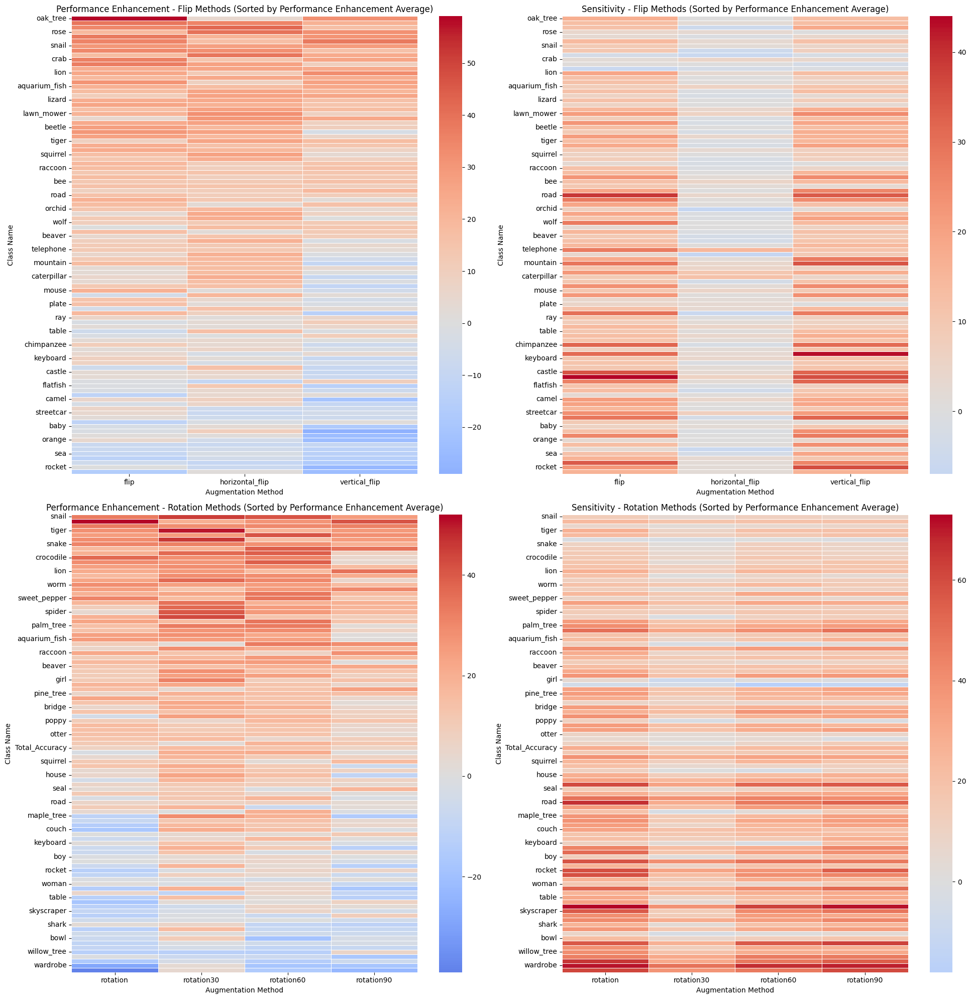

In [48]:
# 사용 예시
csv_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivitiy&performance.csv'
flip_augmentations = ['flip', 'horizontal_flip', 'vertical_flip']
rotation_augmentations = ['rotation', 'rotation30', 'rotation60', 'rotation90']
flip_title = 'Flip Methods'
rotation_title = 'Rotation Methods'

visualize_augmentations(csv_file, flip_augmentations, rotation_augmentations, flip_title, rotation_title)

/tmp/ipykernel_1084501/2901826234.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data_perf_flip = heatmap_data_perf_flip.fillna(0)
/tmp/ipykernel_1084501/2901826234.py:29: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data_sens_flip = heatmap_data_sens_flip.fillna(0)
/tmp/ipykernel_1084501/2901826234.py:30: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('fut

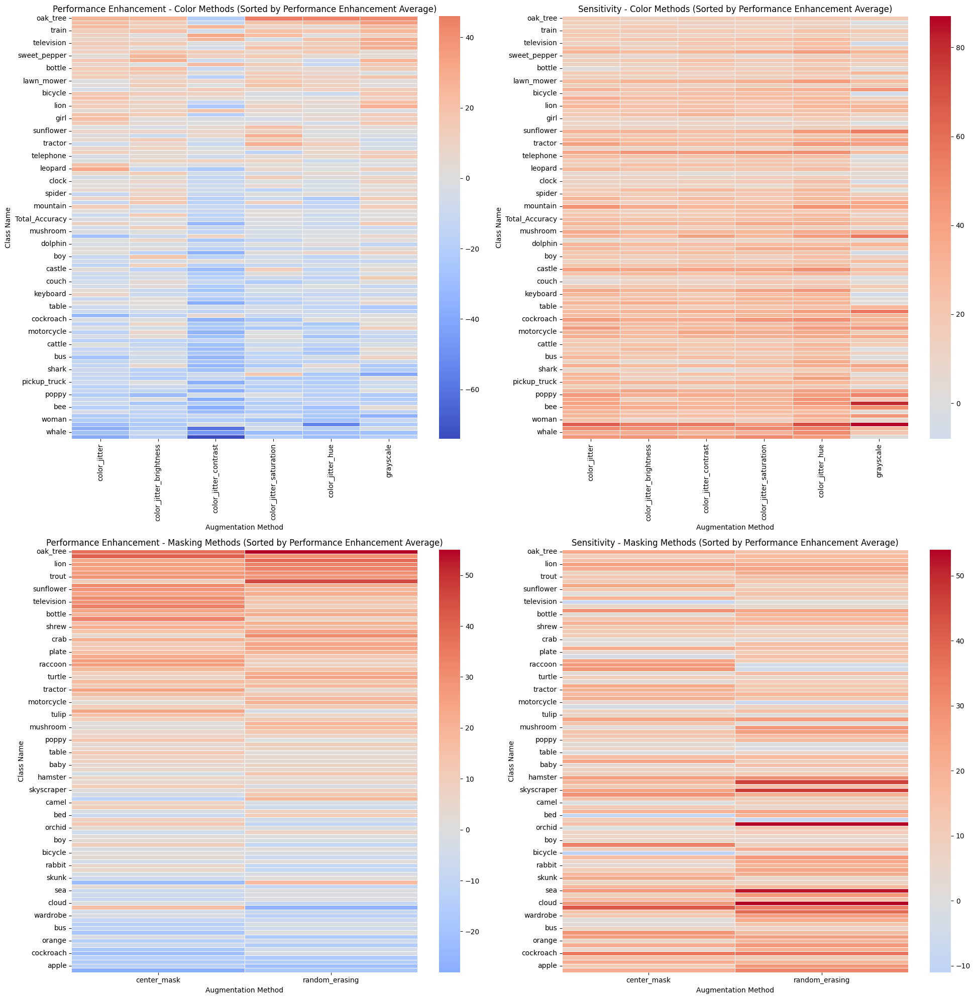

In [49]:
# 사용 예시
csv_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivitiy&performance.csv'
# color_augmentations = ['color_jitter_hue']
color_augmentations = ['color_jitter','color_jitter_brightness','color_jitter_contrast','color_jitter_saturation','color_jitter_hue','grayscale']
# color_augmentations = ['grayscale']
masking_augmentations = ['center_mask','random_erasing']
color_title = 'Color Methods'
masking_title = 'Masking Methods'

visualize_augmentations(csv_file, color_augmentations, masking_augmentations, color_title, masking_title)

/tmp/ipykernel_1144564/2901826234.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data_perf_flip = heatmap_data_perf_flip.fillna(0)
/tmp/ipykernel_1144564/2901826234.py:29: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data_sens_flip = heatmap_data_sens_flip.fillna(0)
/tmp/ipykernel_1144564/2901826234.py:30: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('fut

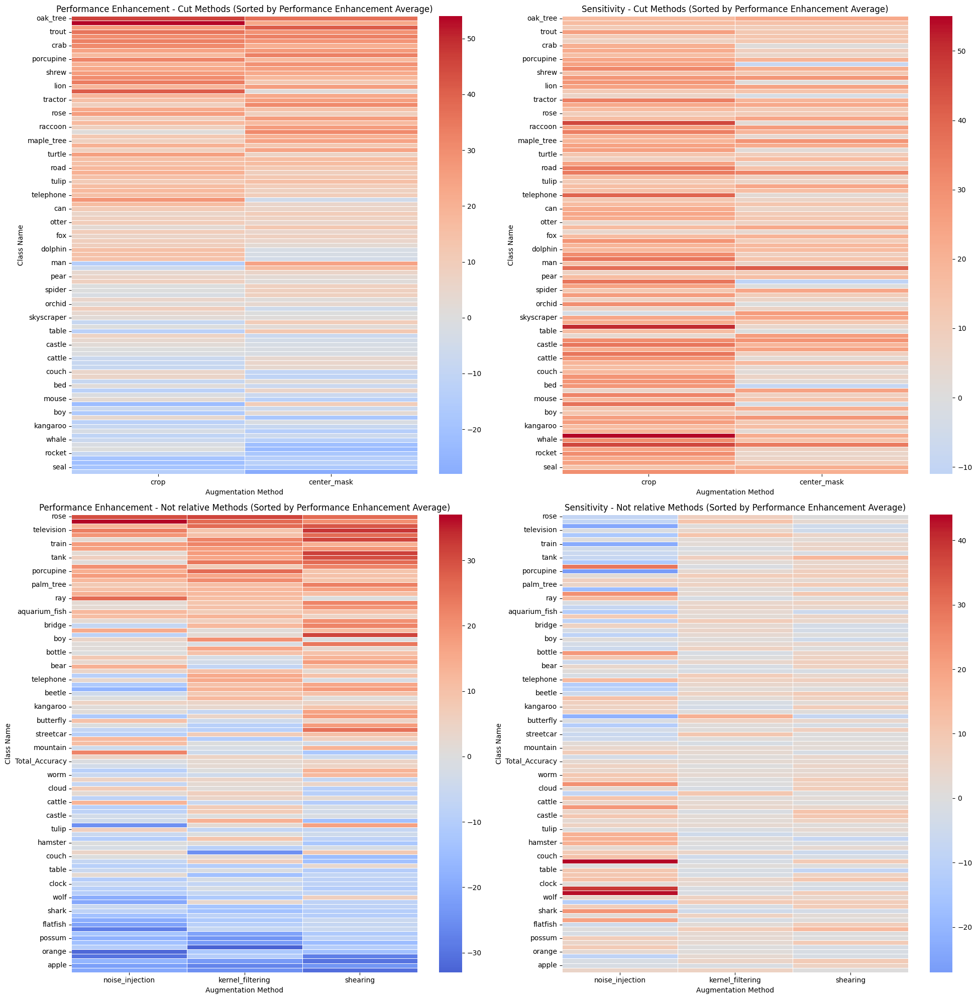

In [24]:
csv_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivitiy&performance.csv'
# geo_augmentations = ['crop','translation','shearing']
geo_augmentations = ['crop', 'center_mask']
surface_augmentations = ['noise_injection','kernel_filtering','shearing']
# surface_augmentations = ['kernel_filtering']
title_1 = 'Cut Methods'
title_2 = 'Not relative Methods'

visualize_augmentations(csv_file, geo_augmentations, surface_augmentations, title_1, title_2)

/tmp/ipykernel_1144564/2901826234.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data_perf_flip = heatmap_data_perf_flip.fillna(0)
/tmp/ipykernel_1144564/2901826234.py:29: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data_sens_flip = heatmap_data_sens_flip.fillna(0)
/tmp/ipykernel_1144564/2901826234.py:30: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('fut

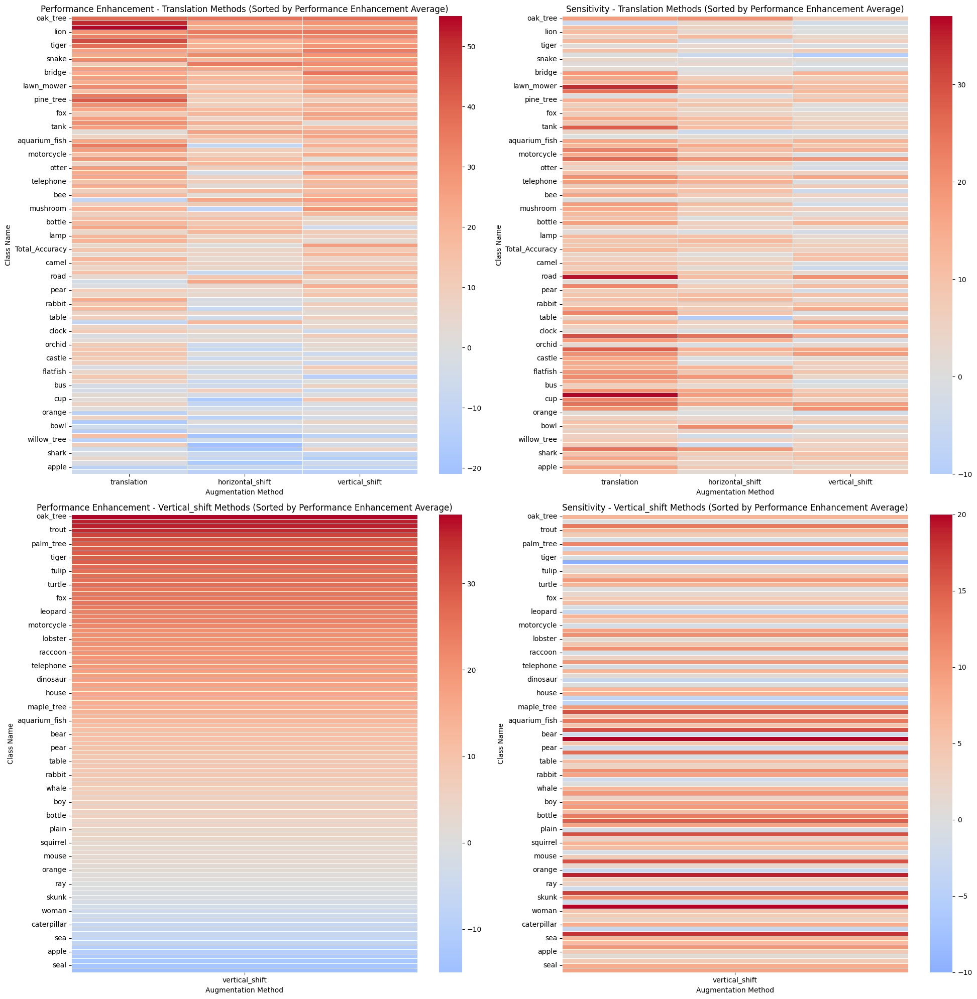

In [ ]:
csv_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivitiy&performance.csv'
translation_augmentations = ['translation','horizontal_shift','vertical_shift']
shearing_augmentations = ['vertical_shift']
title_1 = 'Translation Methods'
title_2 = 'Vertical_shift Methods'

visualize_augmentations(csv_file, translation_augmentations, shearing_augmentations, title_1, title_2)

/tmp/ipykernel_1144564/2901826234.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data_perf_flip = heatmap_data_perf_flip.fillna(0)
/tmp/ipykernel_1144564/2901826234.py:29: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data_sens_flip = heatmap_data_sens_flip.fillna(0)
/tmp/ipykernel_1144564/2901826234.py:30: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('fut

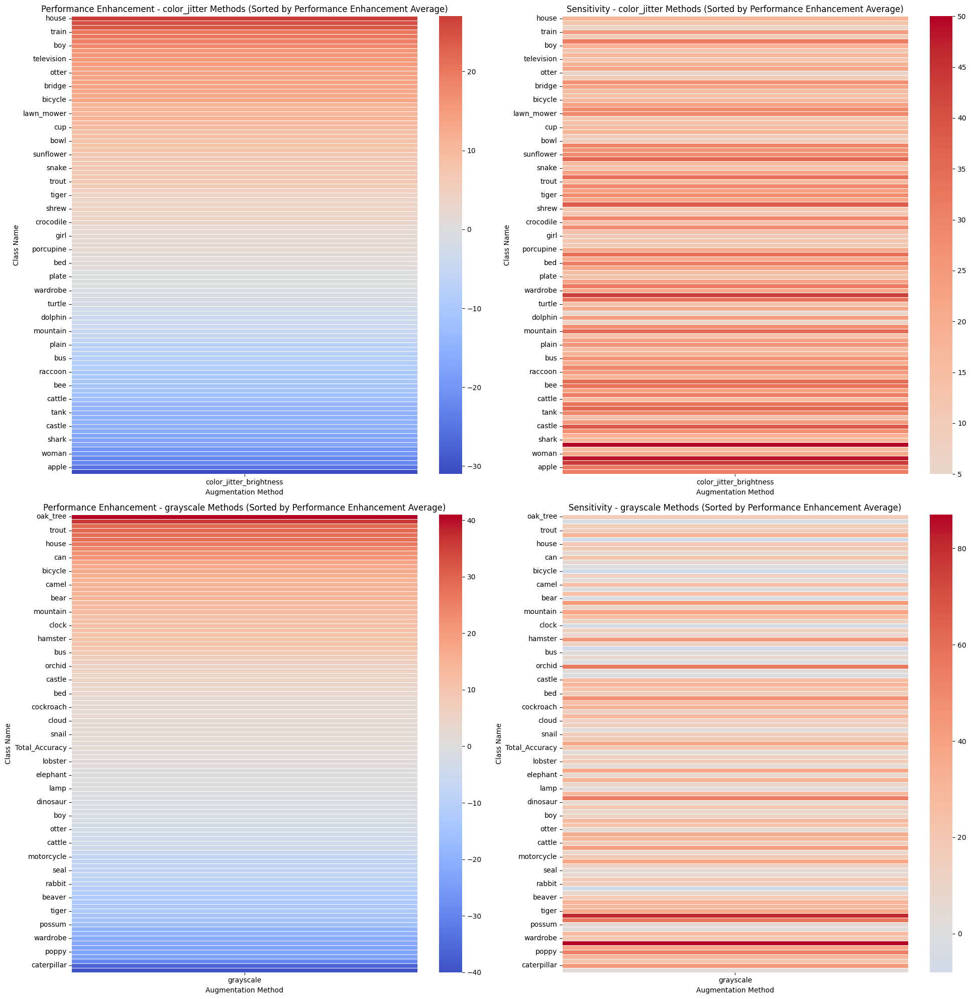

In [17]:
csv_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivitiy&performance.csv'
translation_augmentations = ['color_jitter_brightness']
shearing_augmentations = ['grayscale']
title_1 = 'color_jitter Methods'
title_2 = 'grayscale Methods'

visualize_augmentations(csv_file, translation_augmentations, shearing_augmentations, title_1, title_2)

/tmp/ipykernel_1144564/2901826234.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data_perf_flip = heatmap_data_perf_flip.fillna(0)
/tmp/ipykernel_1144564/2901826234.py:29: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data_sens_flip = heatmap_data_sens_flip.fillna(0)
/tmp/ipykernel_1144564/2901826234.py:30: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('fut

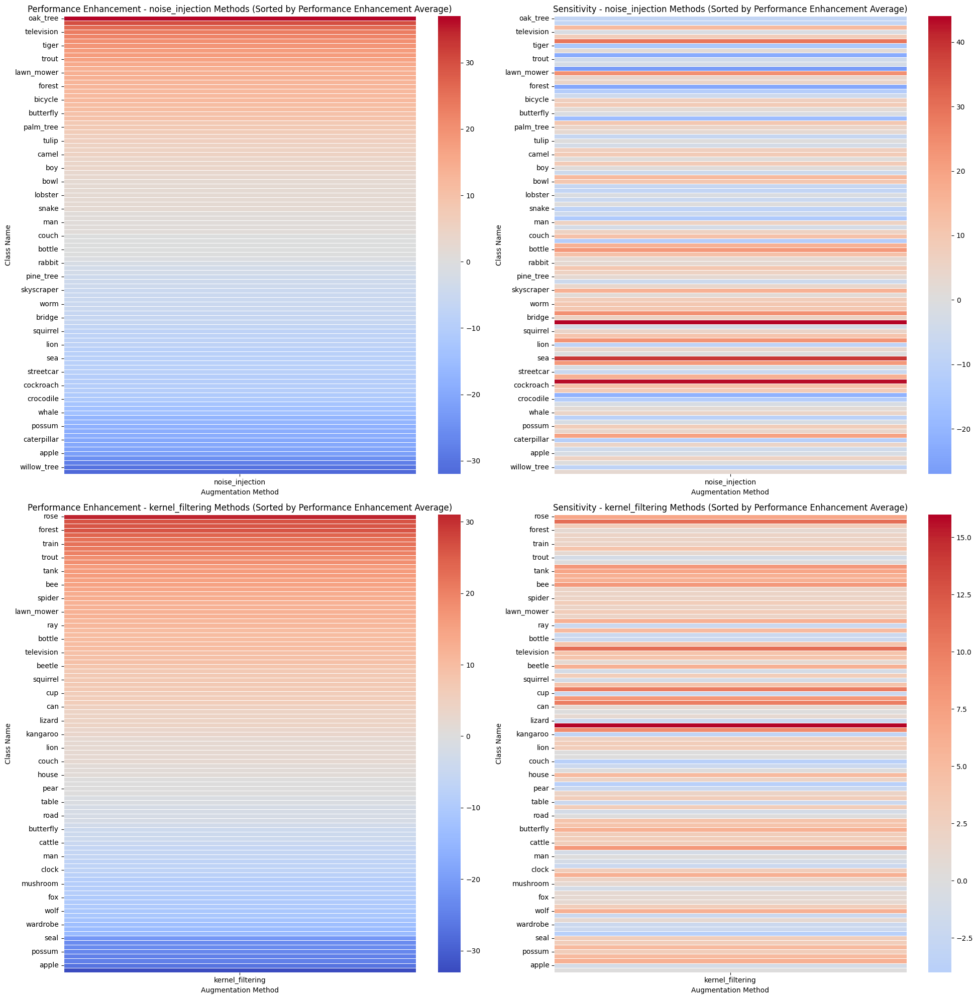

In [20]:
csv_file = '/hdd1/yebin/24-W-SimCLR/playground/results/merged_results_with_sensitivitiy&performance.csv'
translation_augmentations = ['noise_injection']
shearing_augmentations = ['kernel_filtering']
title_1 = 'noise_injection Methods'
title_2 = 'kernel_filtering Methods'

visualize_augmentations(csv_file, translation_augmentations, shearing_augmentations, title_1, title_2)